In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
import data_pipeline2 as dp 

import os
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
#os.environ["OMP_NUM_THREADS"] = "1"

In [2]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

from sklearn.decomposition import PCA


In [3]:
df_train_st, df_test_st = dp.get_cmapss_data(0,80, scaling = 'standard')

df_train_mm, df_test_mm = dp.get_cmapss_data(0,80, scaling = (-1,1))



C:\Users\lefti\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:473: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
C:\Users\lefti\anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:474: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)


In [4]:
df_train_mm

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,25
0,1,1,-0.0007,-0.0004,100.0,-1.0,-0.632530,-0.207455,-0.380486,-1.0,...,0.266525,-5.882353e-01,-0.600784,-0.272028,-1.0,-0.4,-1.0,-1.0,0.448819,0.460821
1,1,2,0.0019,-0.0003,100.0,-1.0,-0.433735,-0.113379,-0.294733,-1.0,...,0.530917,-4.411765e-01,-0.674373,-0.177376,-1.0,-0.4,-1.0,-1.0,0.354331,0.473626
2,1,3,-0.0043,0.0003,100.0,-1.0,-0.313253,-0.283337,-0.258947,-1.0,...,0.590618,-5.588235e-01,-0.656414,-0.285110,-1.0,-0.8,-1.0,-1.0,0.275591,0.252610
3,1,4,0.0007,0.0000,100.0,-1.0,-0.313253,-0.514089,-0.337610,-1.0,...,0.778252,-4.117647e-01,-0.650222,-0.666795,-1.0,-0.4,-1.0,-1.0,0.165354,0.335282
4,1,5,-0.0019,-0.0002,100.0,-1.0,-0.301205,-0.511427,-0.190749,-1.0,...,0.492537,-5.294118e-01,-0.650532,-0.195845,-1.0,-0.2,-1.0,-1.0,0.196850,0.420181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,-1.0,0.373494,0.159973,0.565834,-1.0,...,-0.658849,1.176471e-01,-0.611312,0.313582,-1.0,0.6,-1.0,-1.0,-0.448819,-0.779262
20627,100,197,-0.0016,-0.0005,100.0,-1.0,0.403614,0.449301,0.732951,-1.0,...,-0.577825,-9.094947e-13,-0.622665,0.454406,-1.0,0.2,-1.0,-1.0,-0.748031,-0.261795
20628,100,198,0.0004,0.0000,100.0,-1.0,0.331325,0.358775,0.550641,-1.0,...,-0.437100,5.882353e-02,-0.575704,0.844556,-1.0,0.8,-1.0,-1.0,-0.527559,-0.891162
20629,100,199,-0.0011,0.0003,100.0,-1.0,0.216867,0.483026,0.494936,-1.0,...,-0.582090,2.941176e-02,-0.593869,0.646787,-1.0,0.2,-1.0,-1.0,-0.763780,-0.527349


In [5]:
df_train_st

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,24,25
0,1,1,-0.0007,-0.0004,100.0,0.0,-1.714694,-0.128772,-0.919490,-0.00115,...,-0.000552,-0.264157,0.331646,-1.058954,-0.240439,-0.599332,-0.001092,-0.782855,1.347058,1.190592
1,1,2,0.0019,-0.0003,100.0,0.0,-1.055642,0.217986,-0.637000,-0.00115,...,-0.000552,-0.189405,1.169417,-0.370767,-0.631974,-0.270947,-0.001092,-0.782855,1.013970,1.233100
2,1,3,-0.0043,0.0003,100.0,0.0,-0.656217,-0.408469,-0.519111,-0.00115,...,-0.000552,-1.011681,1.358591,-0.921316,-0.536424,-0.644718,-0.001092,-2.083809,0.736397,0.499365
3,1,4,0.0007,0.0000,100.0,0.0,-0.656217,-1.259008,-0.778245,-0.00115,...,-0.000552,-1.534947,1.953138,-0.233130,-0.503476,-1.968937,-0.001092,-0.782855,0.347794,0.773823
4,1,5,-0.0019,-0.0002,100.0,0.0,-0.616274,-1.249194,-0.294453,-0.00115,...,-0.000552,-0.974305,1.047805,-0.783679,-0.505124,-0.335022,-0.001092,-0.132378,0.458823,1.055673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20626,100,196,-0.0004,-0.0003,100.0,0.0,1.620507,1.225548,2.197908,-0.00115,...,-0.000552,1.978413,-2.600551,2.244340,-0.296451,1.432383,-0.001092,2.469530,-1.817280,-2.926274
20627,100,197,-0.0016,-0.0005,100.0,0.0,1.720363,2.291993,2.748430,-0.00115,...,-0.000552,1.866284,-2.343815,1.693791,-0.356857,1.920956,-0.001092,1.168576,-2.872059,-1.208372
20628,100,198,0.0004,0.0000,100.0,0.0,1.480708,1.958320,2.147861,-0.00115,...,-0.000552,2.053165,-1.897905,1.969066,-0.106999,3.274543,-0.001092,3.120007,-2.094853,-3.297762
20629,100,199,-0.0011,0.0003,100.0,0.0,1.101254,2.416303,1.964354,-0.00115,...,-0.000552,3.174450,-2.357327,1.831428,-0.203647,2.588405,-0.001092,1.168576,-2.927574,-2.089963


In [6]:
X_standard = df_train_st[df_train_st.columns].to_numpy().T

In [7]:
X_minmax = df_train_mm[df_train_mm.columns].to_numpy().T

In [8]:
X_minmax[5:].shape

(21, 16584)

epsilon 26.0 2
2 5
1 6
1 7
1 8
2 9
1 10
1 11
1 12
1 13
2 14
1 15
1 16
1 17
1 18
1 19
2 20
1 21
2 22
2 23
1 24
1 25


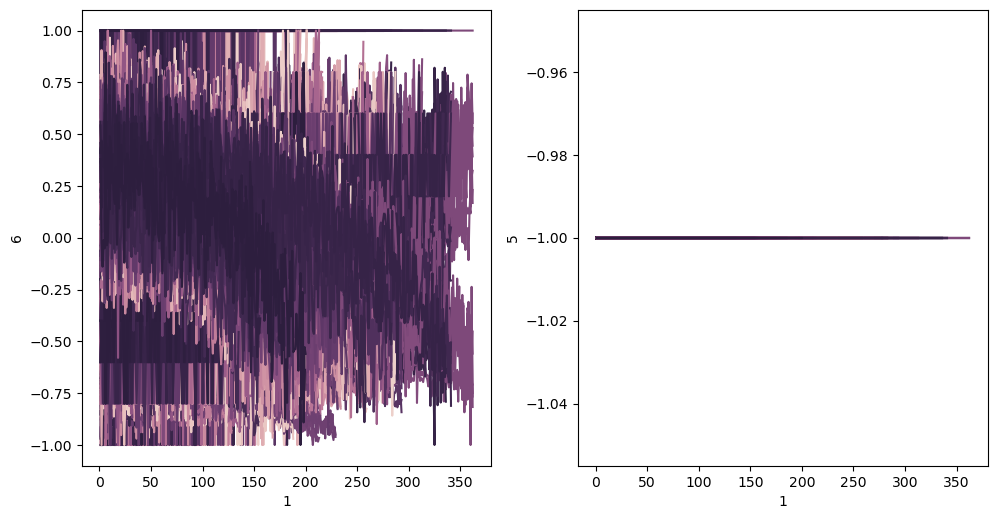

epsilon 28.473684210526315 4
2 5
1 6
1 7
3 8
2 9
1 10
4 11
1 12
1 13
2 14
3 15
4 16
1 17
1 18
3 19
2 20
1 21
2 22
2 23
4 24
4 25


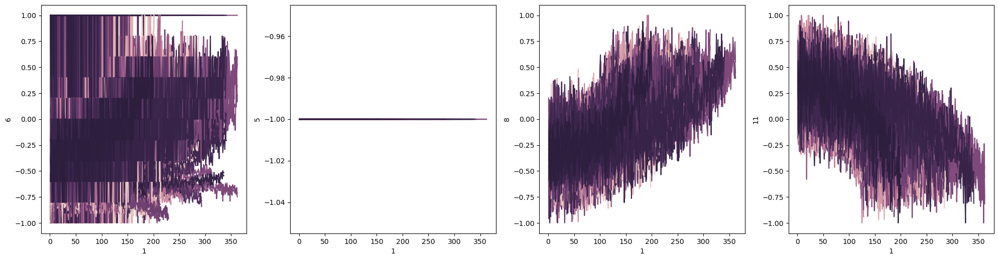

epsilon 30.94736842105263 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
1 12
1 13
2 14
3 15
4 16
1 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


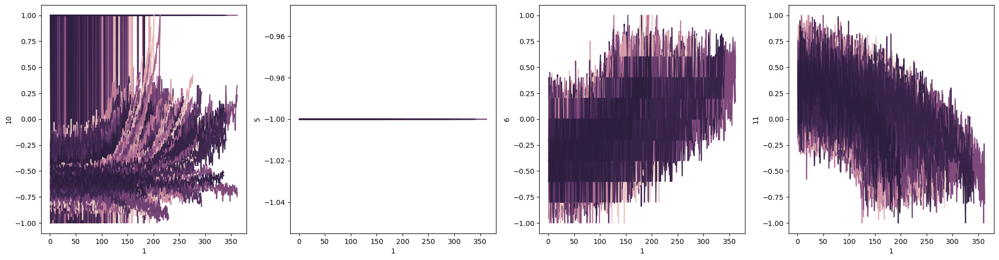

epsilon 33.421052631578945 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
1 12
1 13
2 14
3 15
4 16
1 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


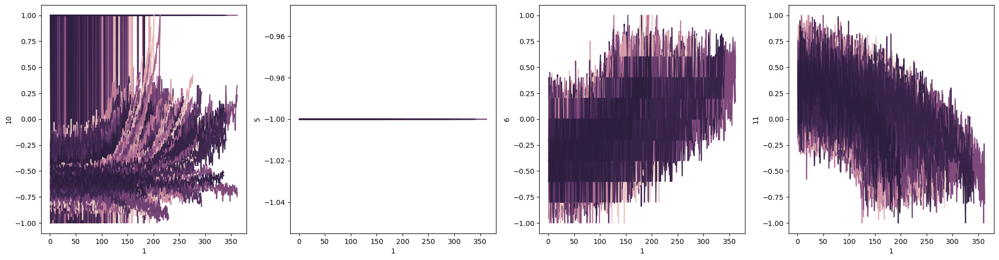

epsilon 35.89473684210526 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


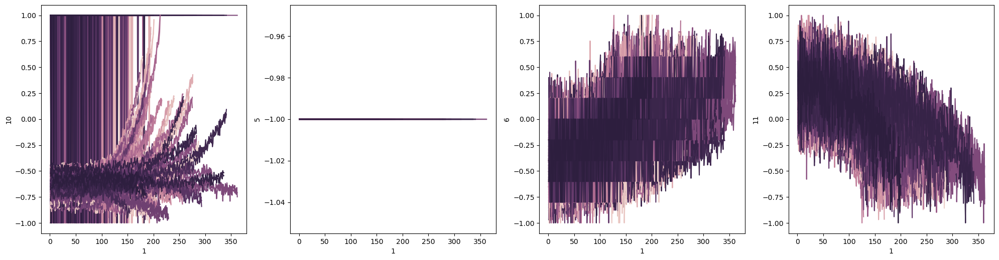

epsilon 38.368421052631575 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


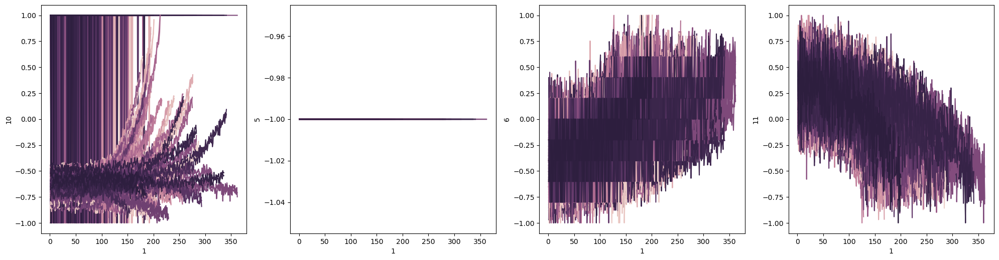

epsilon 40.8421052631579 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


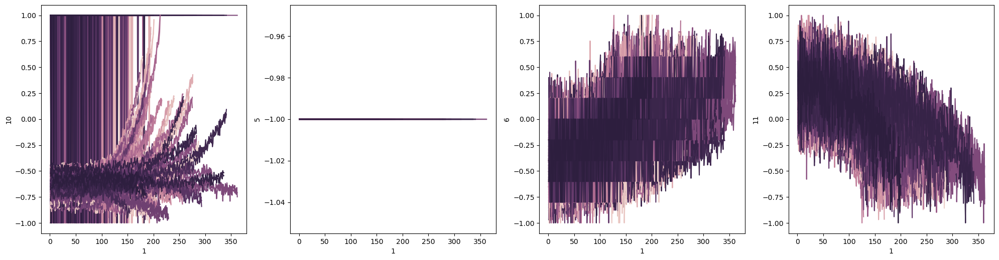

epsilon 43.31578947368421 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


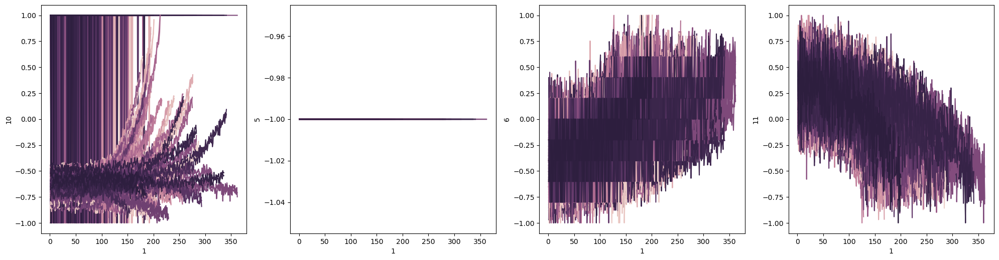

epsilon 45.78947368421053 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
3 13
2 14
3 15
4 16
3 17
3 18
3 19
2 20
3 21
2 22
2 23
4 24
4 25


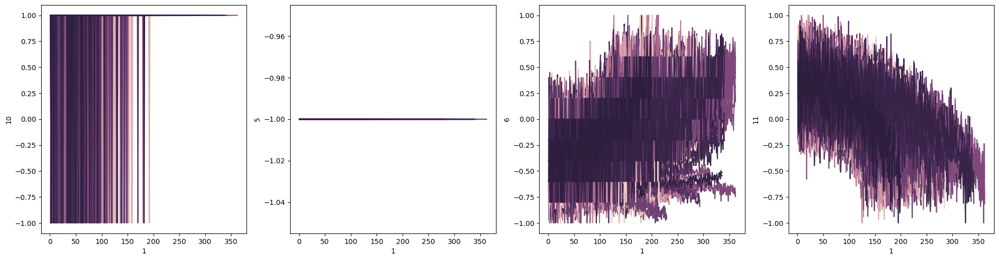

epsilon 48.26315789473684 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
3 13
2 14
3 15
4 16
3 17
3 18
3 19
2 20
3 21
2 22
2 23
4 24


In [ ]:
for eps in np.linspace(26,73,20):
    clusterer = DBSCAN(eps = eps, min_samples = 3)

    cluster_labels = clusterer.fit_predict(X_minmax[5:])
    
    print('epsilon', eps, len(np.unique(cluster_labels)))
    if (len(np.unique(cluster_labels))>1): 

        plt.figure(figsize = (20,10))

        labs = cluster_labels + 2

        i=0
        
        for column in df_train_mm.columns[5:]:
            plt.subplot(2,4,labs[i])
            sns.lineplot(df_train_mm, x = 1, y = column, hue = 0, legend = False)
            print(labs[i], column)


            i+=1
        plt.tight_layout()
        plt.show()


epsilon 76.0 2
2 5
1 6
1 7
1 8
2 9
1 10
1 11
1 12
1 13
2 14
1 15
1 16
1 17
1 18
1 19
2 20
1 21
1 24
1 25


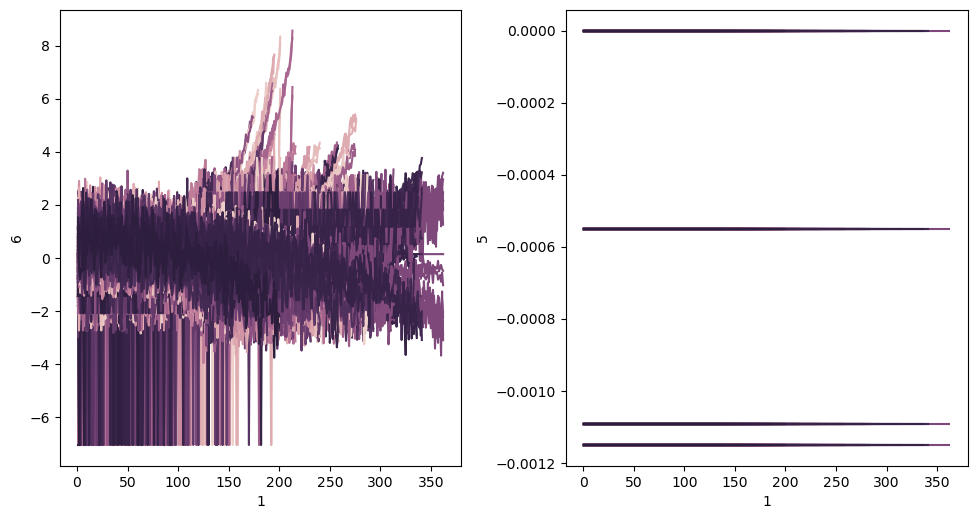

epsilon 79.26315789473684 2
2 5
1 6
1 7
1 8
2 9
1 10
1 11
1 12
1 13
2 14
1 15
1 16
1 17
1 18
1 19
2 20
1 21
1 24
1 25


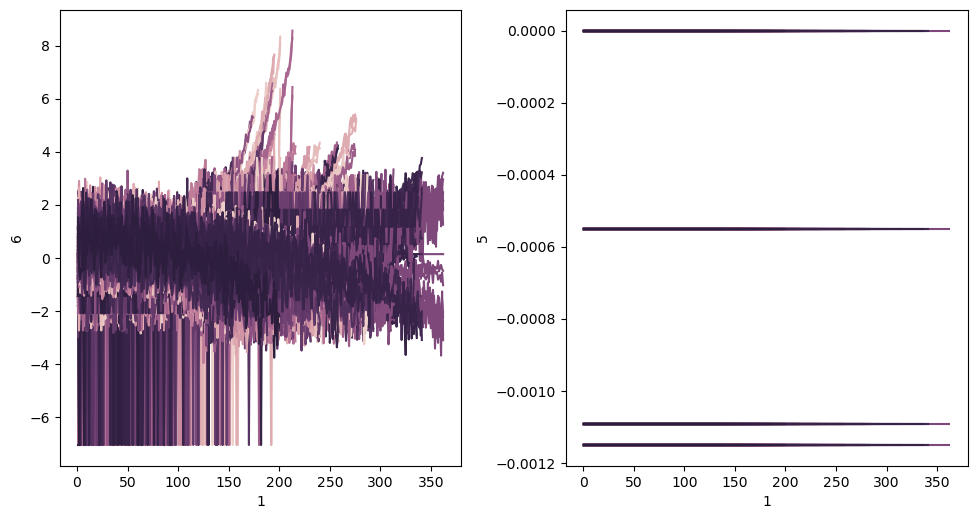

epsilon 82.52631578947368 2
2 5
1 6
1 7
1 8
2 9
1 10
1 11
1 12
1 13
2 14
1 15
1 16
1 17
1 18
1 19
2 20
1 21
1 24
1 25


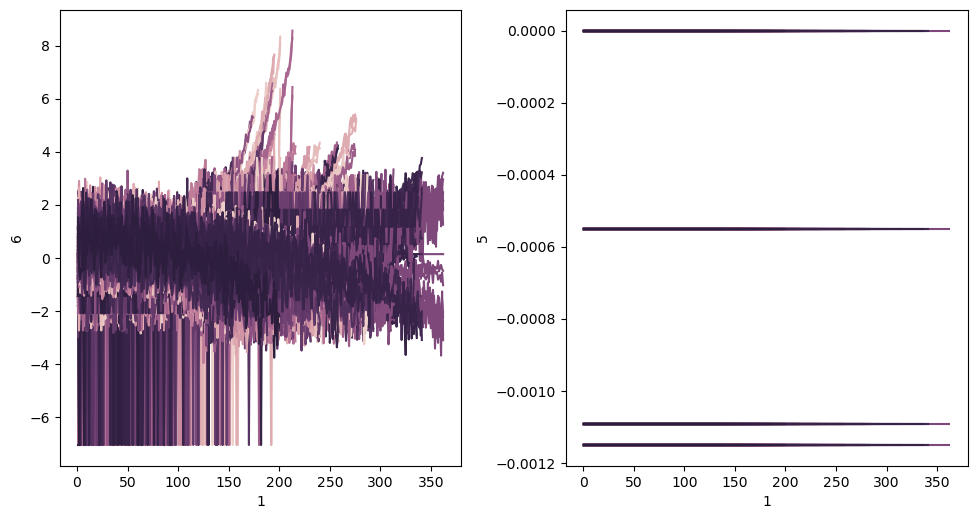

epsilon 85.78947368421052 3
2 5
1 6
1 7
3 8
2 9
1 10
1 11
3 12
1 13
2 14
3 15
1 16
3 17
1 18
3 19
2 20
1 21
1 24
1 25


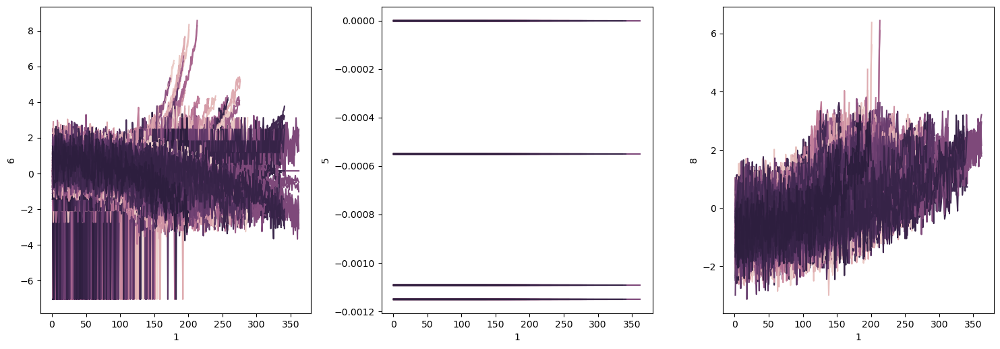

epsilon 89.05263157894737 3
2 5
1 6
1 7
3 8
2 9
1 10
1 11
3 12
1 13
2 14
3 15
1 16
3 17
1 18
3 19
2 20
1 21
1 24
1 25


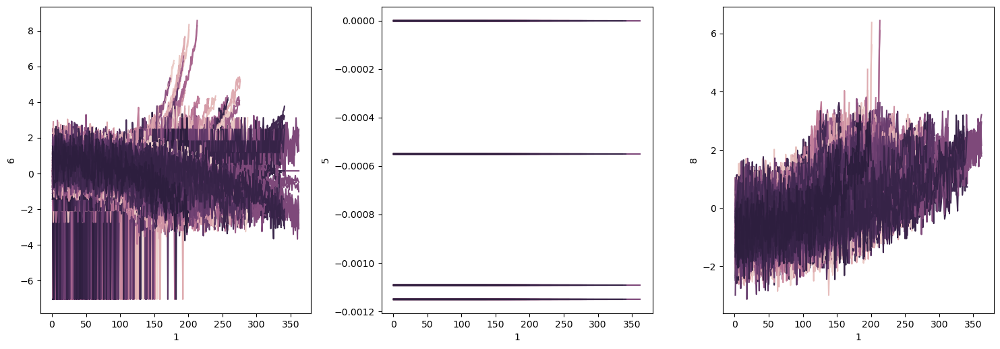

epsilon 92.3157894736842 4
2 5
1 6
1 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
1 21
4 24
4 25


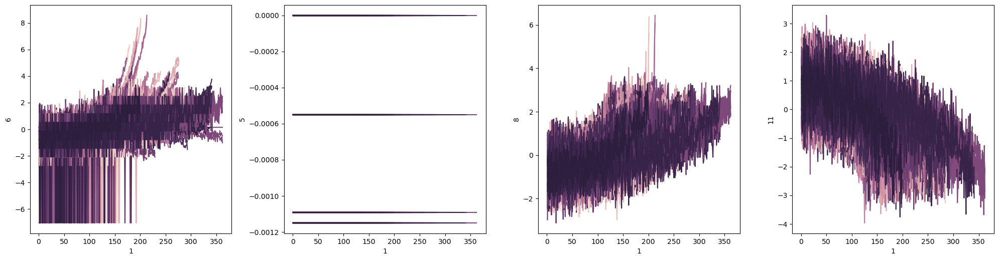

epsilon 95.57894736842105 4
2 5
3 6
1 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
1 21
4 24
4 25


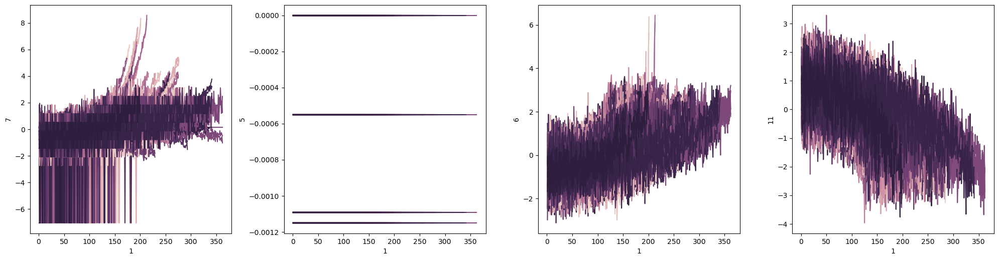

epsilon 98.84210526315789 4
2 5
3 6
1 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


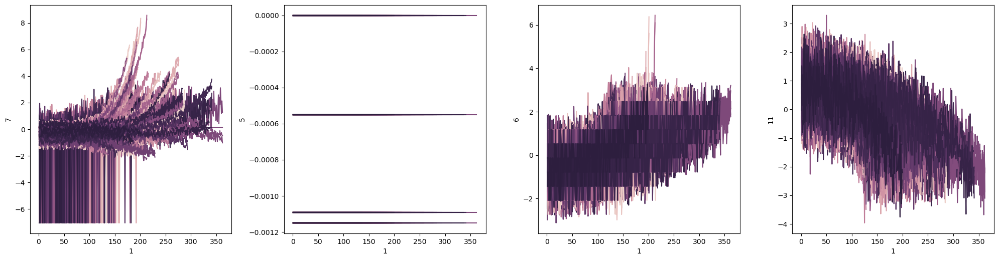

epsilon 102.10526315789474 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


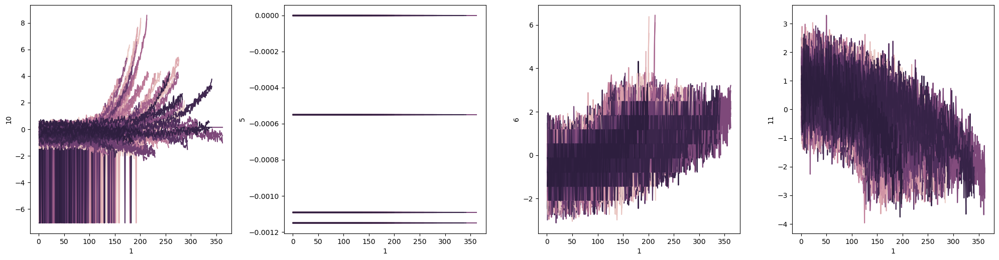

epsilon 105.36842105263158 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


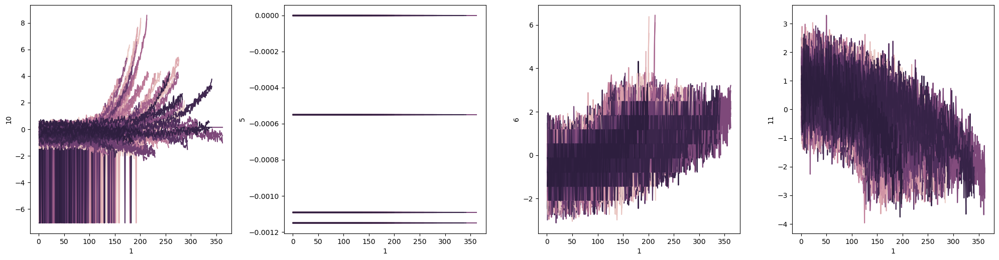

epsilon 108.63157894736841 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


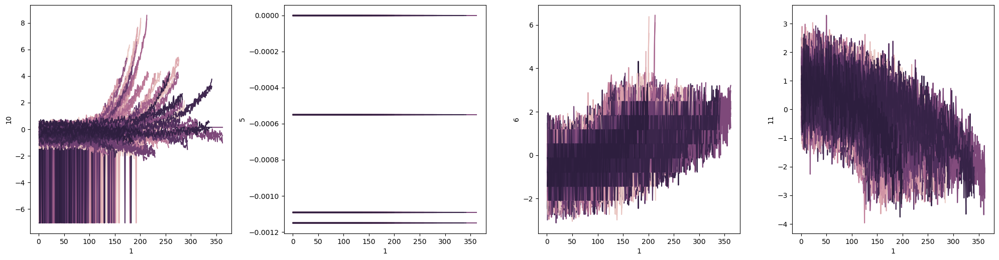

epsilon 111.89473684210526 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


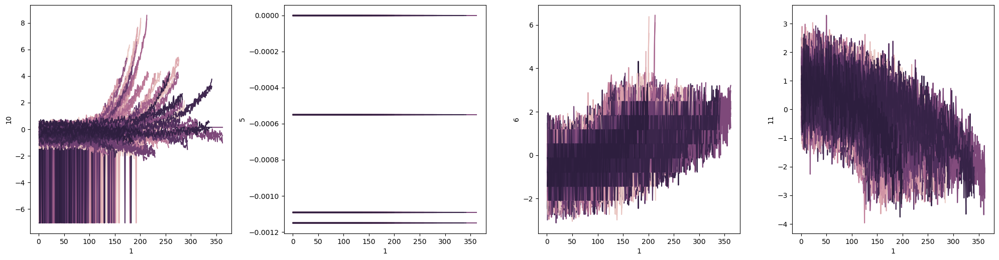

epsilon 115.15789473684211 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


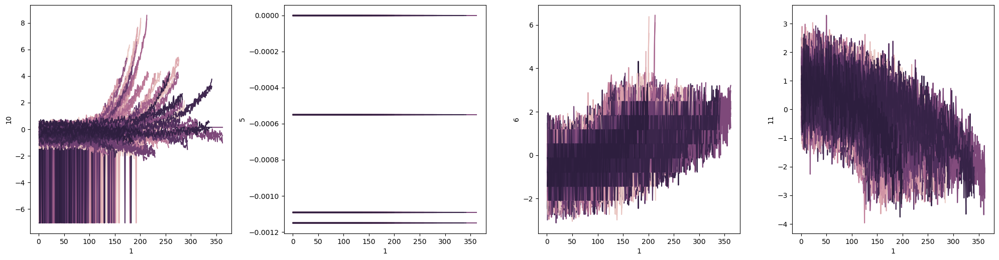

epsilon 118.42105263157895 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


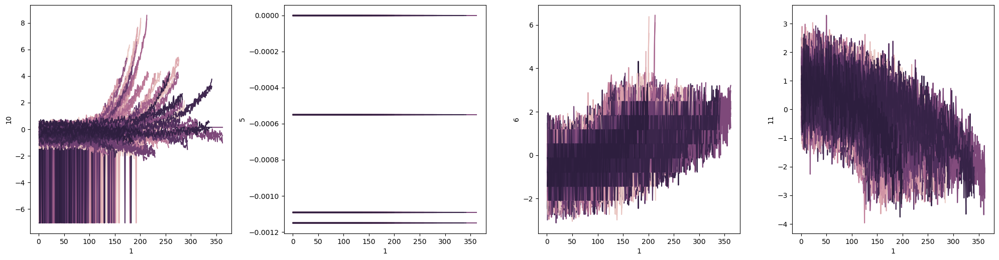

epsilon 121.68421052631578 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


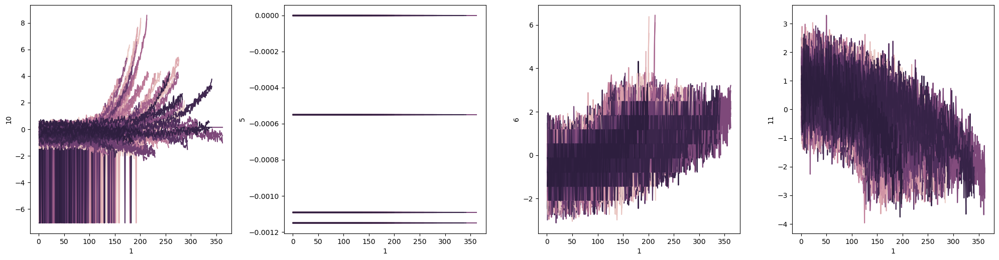

epsilon 124.94736842105263 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


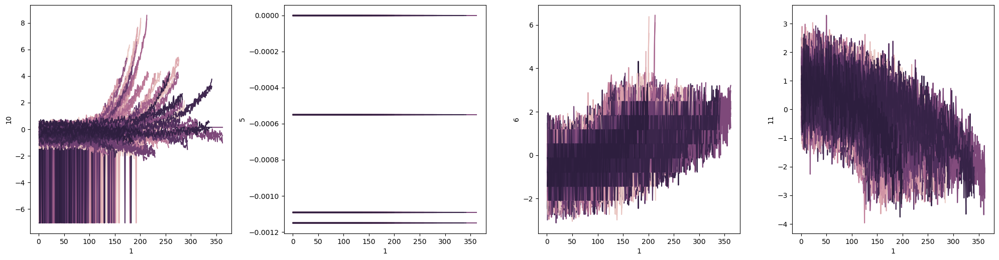

epsilon 128.21052631578948 4
2 5
3 6
3 7
3 8
2 9
1 10
4 11
3 12
1 13
2 14
3 15
4 16
3 17
1 18
3 19
2 20
3 21
4 24
4 25


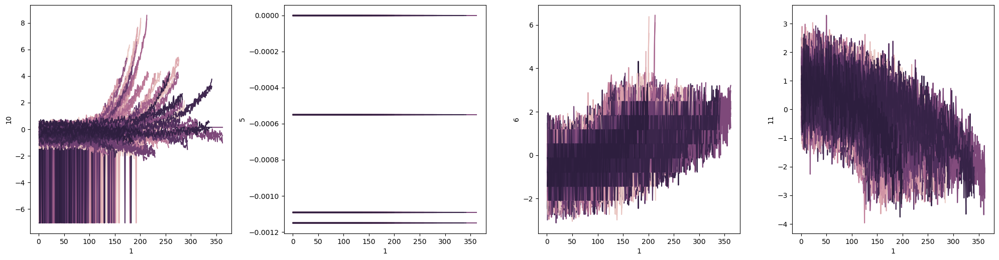

epsilon 131.4736842105263 1
epsilon 134.73684210526315 1
epsilon 138.0 1


In [20]:
for eps in np.linspace(76,138,20):
    clusterer = DBSCAN(eps = eps, min_samples = 3)

    cluster_labels = clusterer.fit_predict(X_standard[5:])
    
    print('epsilon', eps, len(np.unique(cluster_labels)))
    if (len(np.unique(cluster_labels))>1): 

        plt.figure(figsize = (20,10))

        labs = cluster_labels + 2

        i=0
        
        for column in df_train_st.columns[5:]:
            plt.subplot(2,4,labs[i])
            sns.lineplot(df_train_st, x = 1, y = column, hue = 0, legend = False)
            print(labs[i], column)


            i+=1
        plt.tight_layout()
        plt.show()


For epsilon = 26.0 The average silhouette_score is : -0.380452590030408


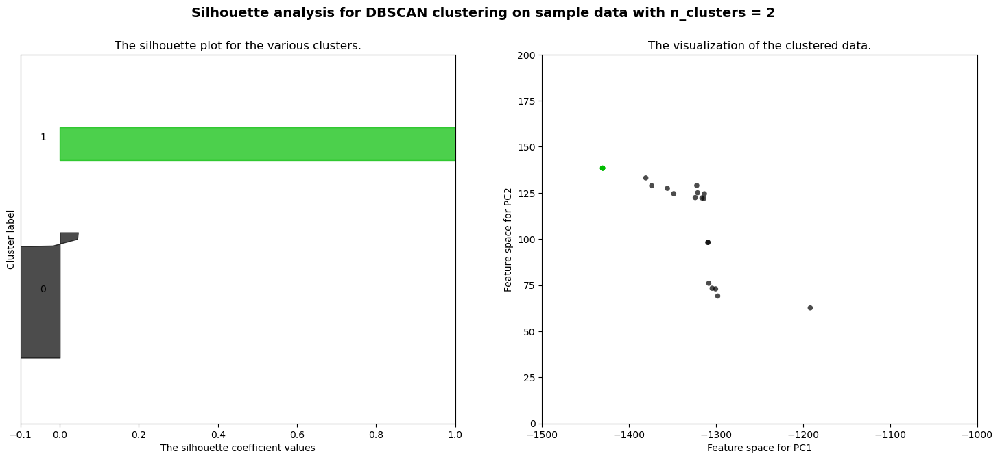

For epsilon = 28.473684210526315 The average silhouette_score is : 0.03038682451013143


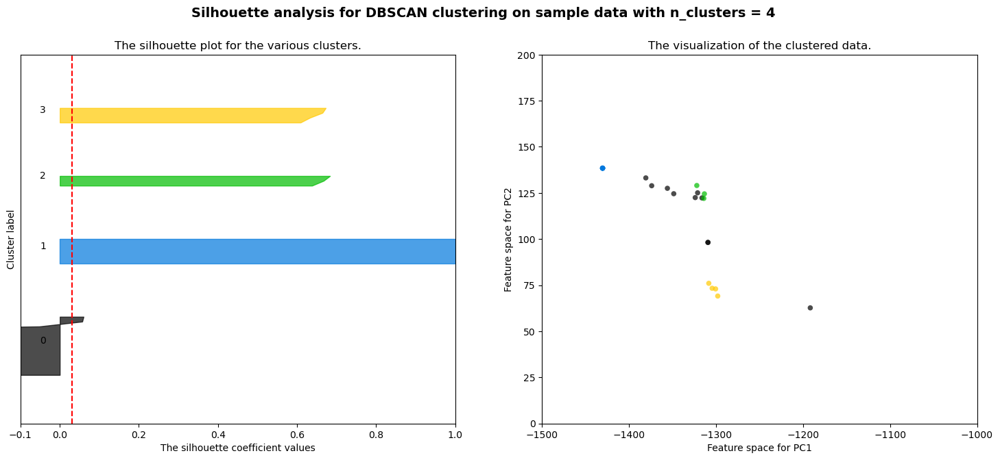

For epsilon = 30.94736842105263 The average silhouette_score is : 0.20761009173391207


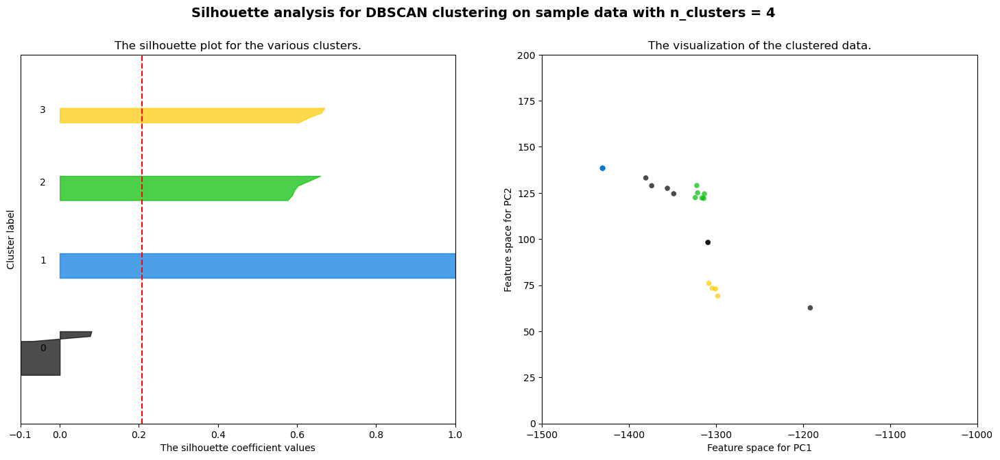

For epsilon = 33.421052631578945 The average silhouette_score is : 0.20761009173391207


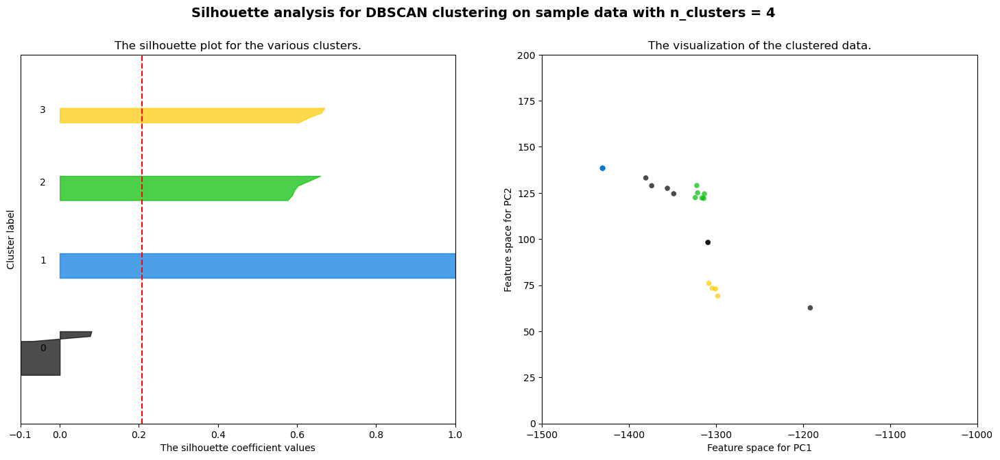

For epsilon = 35.89473684210526 The average silhouette_score is : 0.31581827161403186


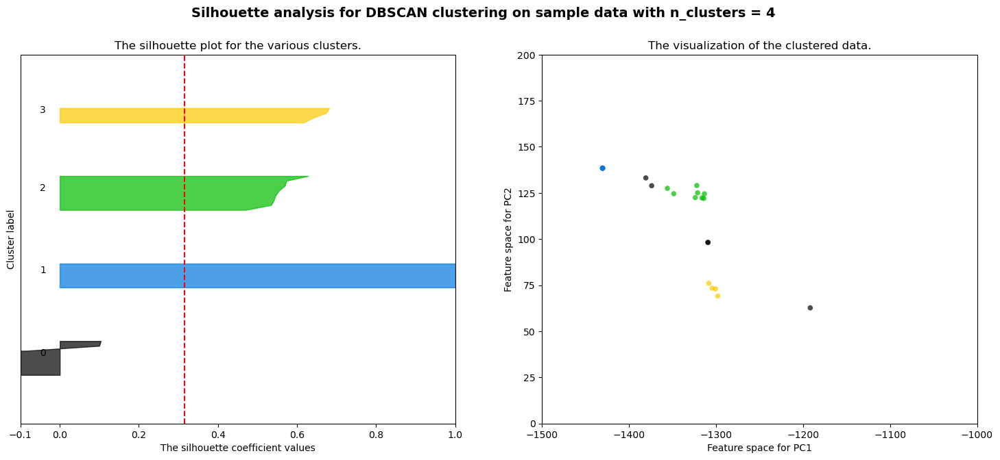

For epsilon = 38.368421052631575 The average silhouette_score is : 0.38552393860459233


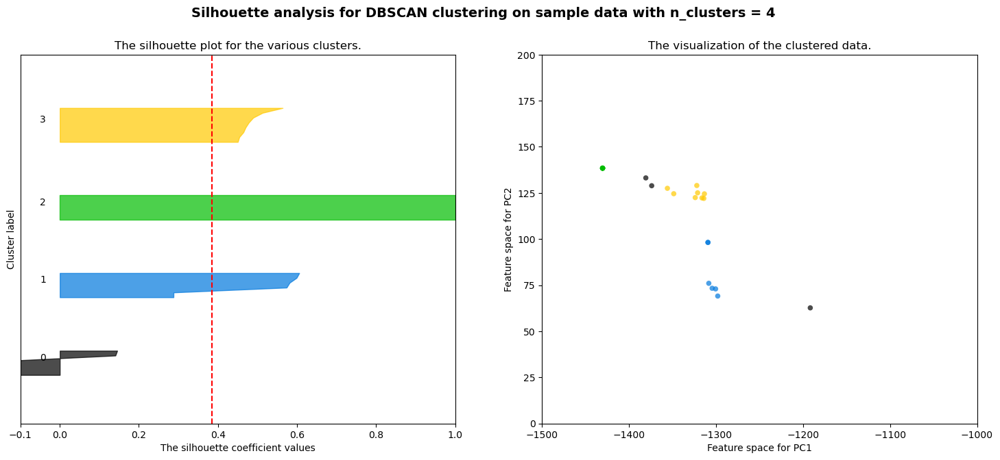

For epsilon = 40.8421052631579 The average silhouette_score is : 0.42201240869934586


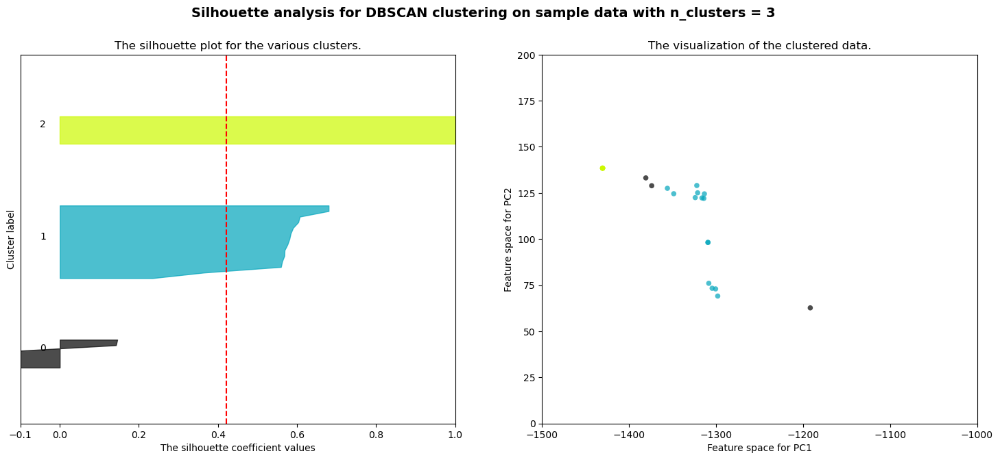

For epsilon = 43.31578947368421 The average silhouette_score is : 0.42201240869934586


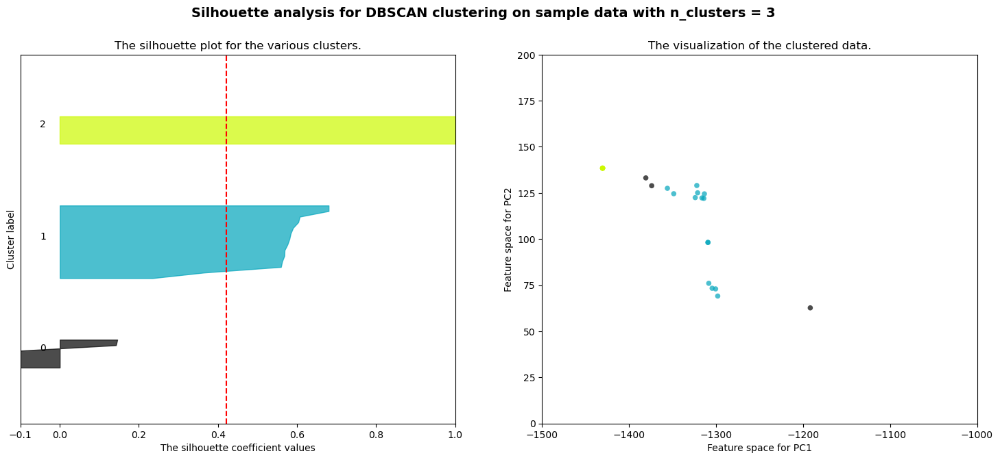

For epsilon = 45.78947368421053 The average silhouette_score is : 0.47564165585519247


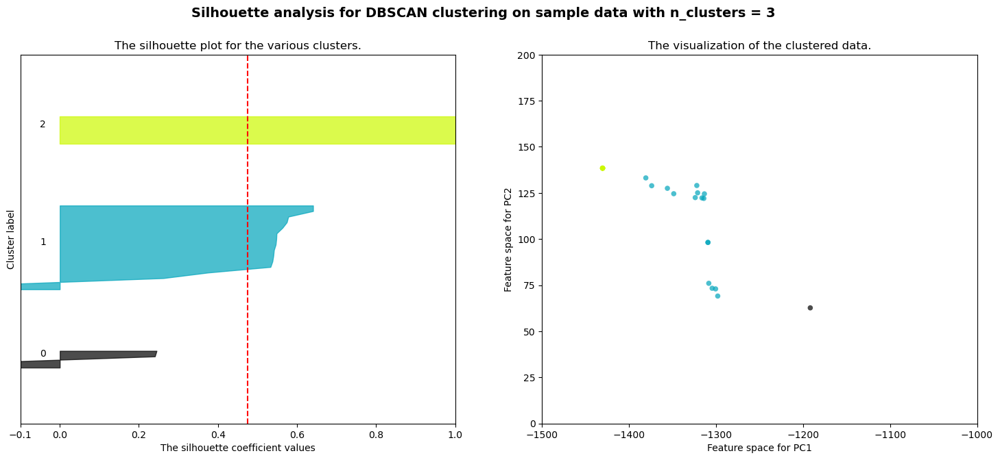

For epsilon = 48.26315789473684 The average silhouette_score is : 0.47564165585519247


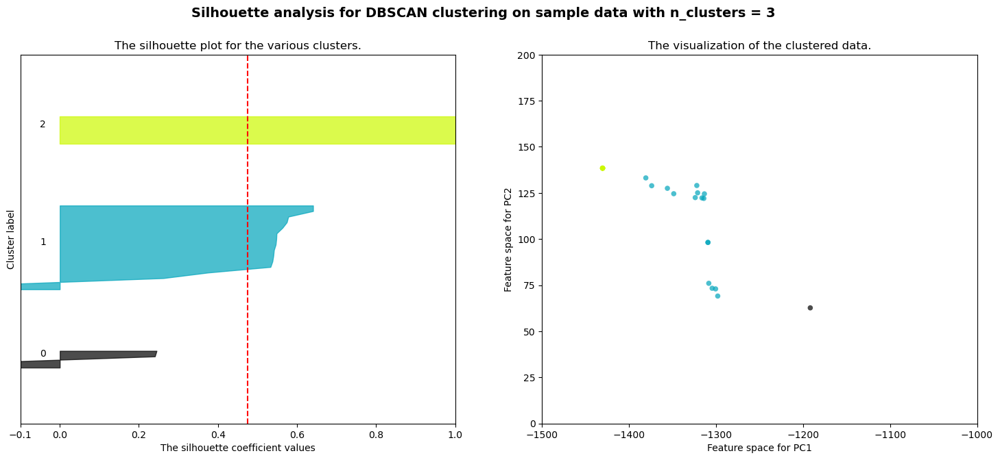

For epsilon = 50.73684210526316 The average silhouette_score is : 0.47564165585519247


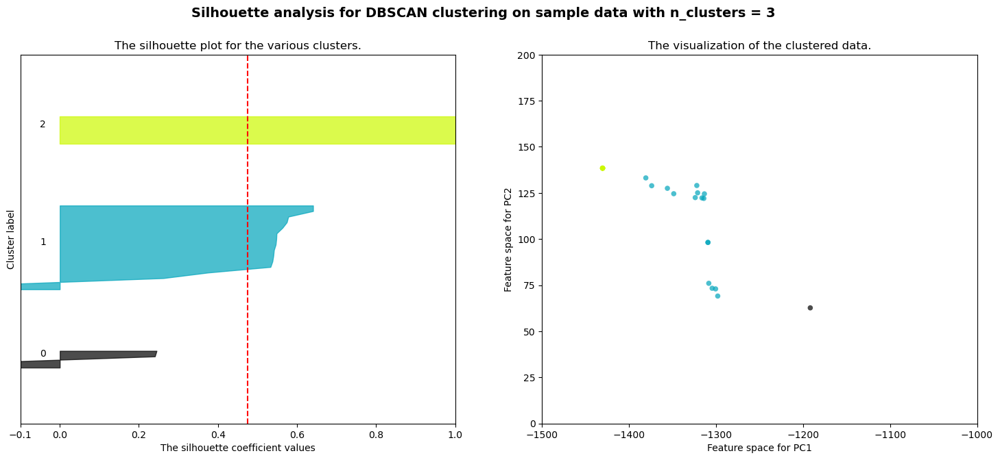

For epsilon = 53.21052631578948 The average silhouette_score is : 0.47564165585519247


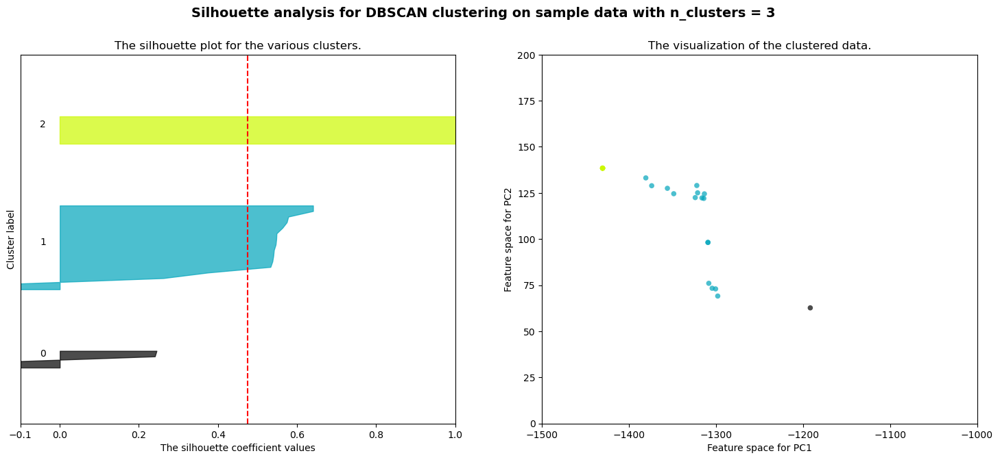

For epsilon = 55.684210526315795 The average silhouette_score is : 0.8137685311653221


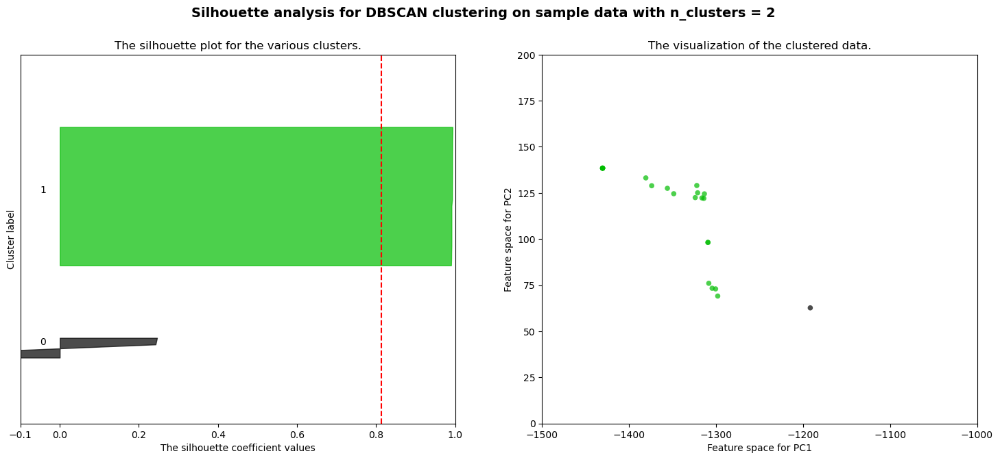

For epsilon = 58.15789473684211 The average silhouette_score is : 0.8137685311653221


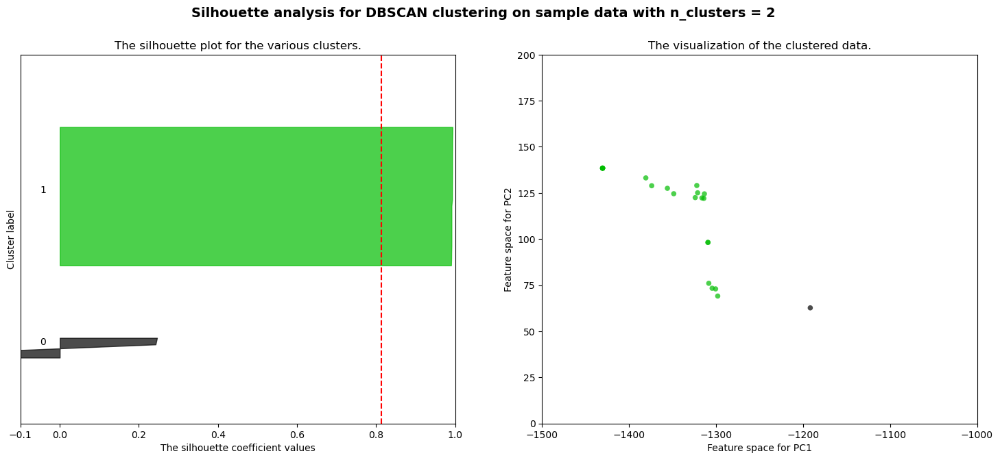

For epsilon = 60.631578947368425 The average silhouette_score is : 0.8137685311653221


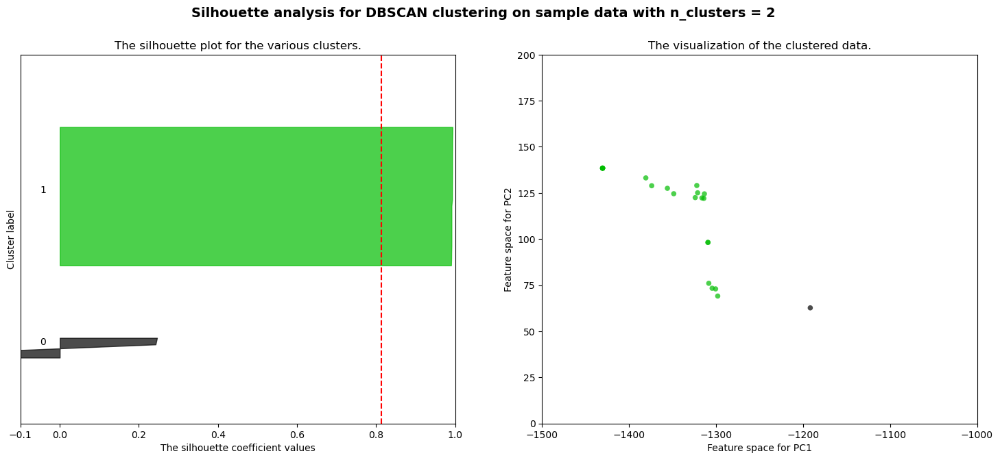

For epsilon = 63.10526315789474 The average silhouette_score is : 0.8137685311653221


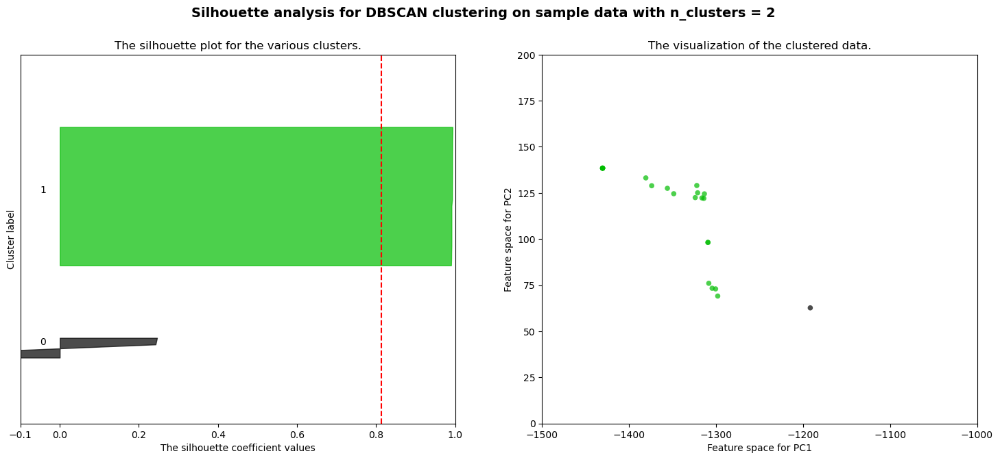

For epsilon = 65.57894736842105 The average silhouette_score is : 0.8137685311653221


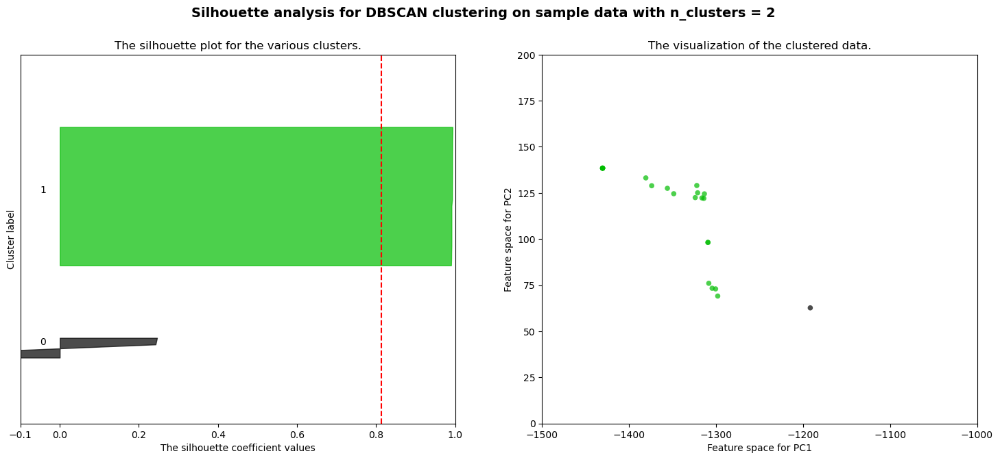

For epsilon = 68.05263157894737 The average silhouette_score is : 0.8137685311653221


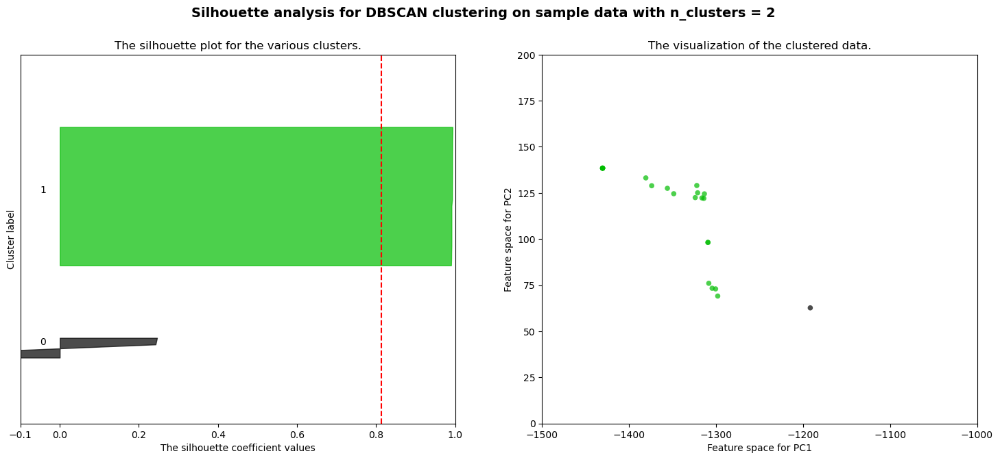

For epsilon = 70.52631578947368 The average silhouette_score is : 0.8137685311653221


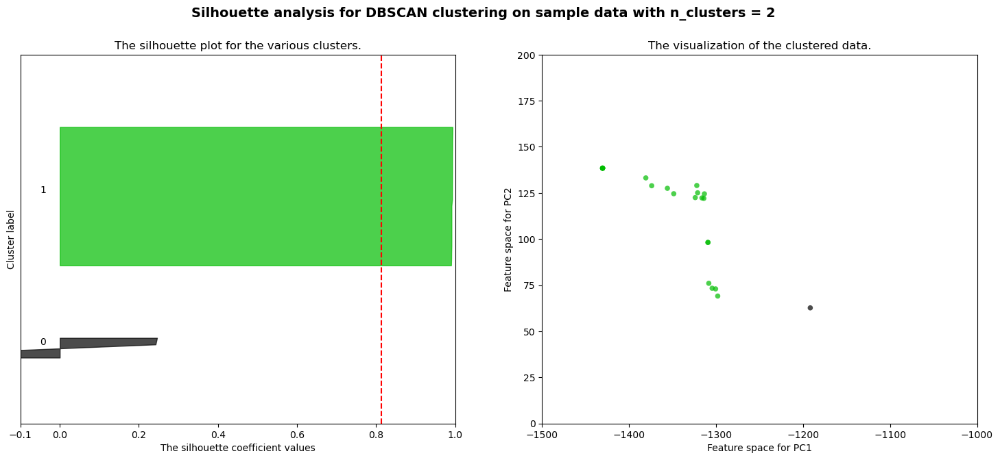

For epsilon = 73.0 The average silhouette_score is : 0.8137685311653221


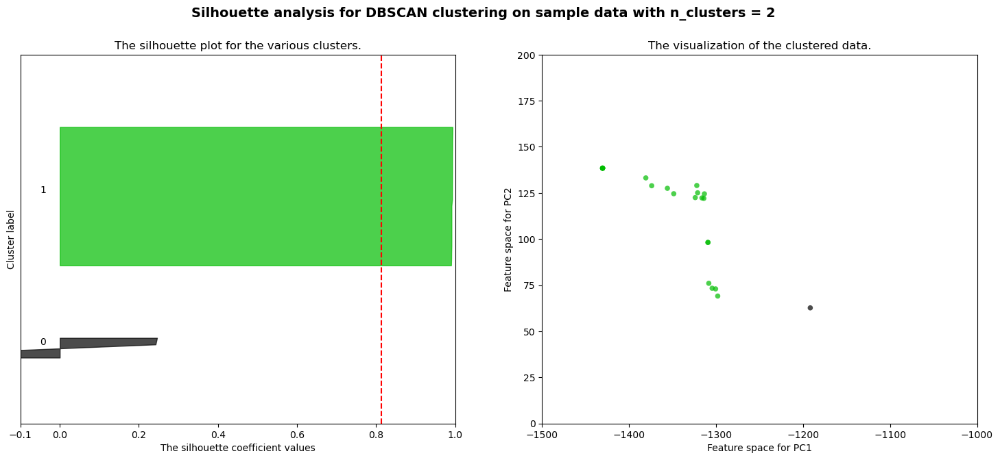

In [19]:
for eps in np.linspace(26,73,20):
    clusterer = DBSCAN(eps = eps, min_samples = 3)

    cluster_labels = clusterer.fit_predict(X_minmax)
    
    cluster_labels = cluster_labels + 1
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters

    if (len(np.unique(cluster_labels))>1):
        
        silhouette_avg = silhouette_score(X_minmax, cluster_labels)
        print("For epsilon =",
            eps,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_minmax, cluster_labels)
        
        
        n_clusters = len(np.unique(cluster_labels))

        y_lower = 10
        
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_minmax) + (n_clusters + 1) * 10])
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

        # Reduce to 2 dimensions using PCA
        pca = PCA(n_components=2)
        X_2d = pca.fit_transform(X_minmax)
        
        
        ax2.set_ylim(0,200)
        ax2.set_xlim(-1500,-1000)
        
        
        ax2.scatter(
            X_2d[:, 0], X_2d[:, 1], marker="o", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )
        
        plt.suptitle(
    "Silhouette analysis for DBSCAN clustering on sample data with n_clusters = %d"
    % n_clusters,
    fontsize=14,
    fontweight="bold")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for PC1")
        ax2.set_ylabel("Feature space for PC2")


    plt.show()

For epsilon = 76.0 The average silhouette_score is : -0.3384006708037894


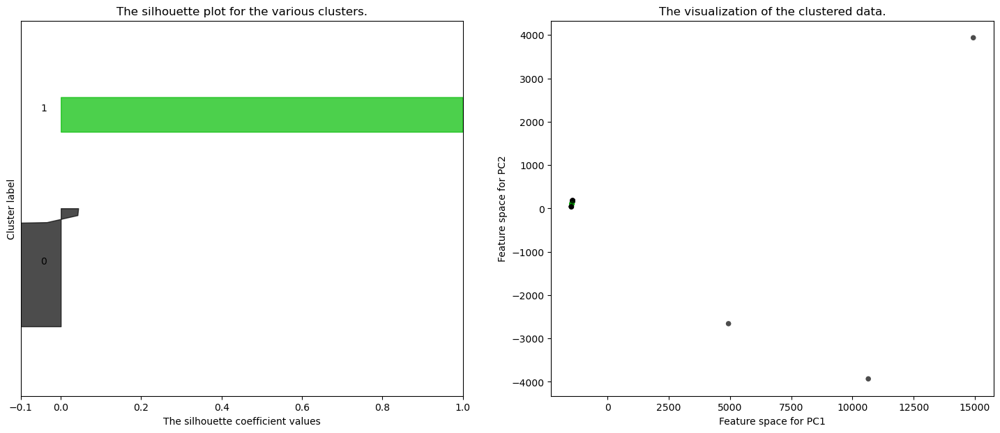

For epsilon = 78.13793103448276 The average silhouette_score is : -0.3384006708037894


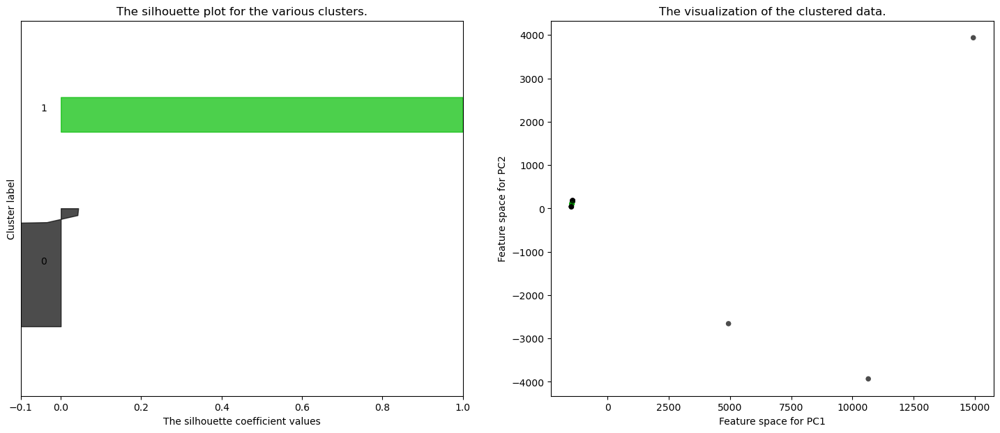

For epsilon = 80.27586206896552 The average silhouette_score is : -0.3384006708037894


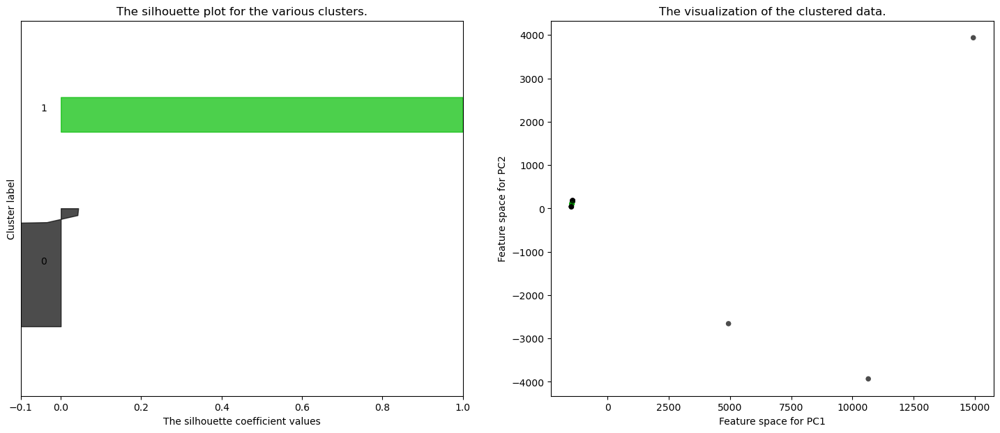

For epsilon = 82.41379310344827 The average silhouette_score is : -0.3384006708037894


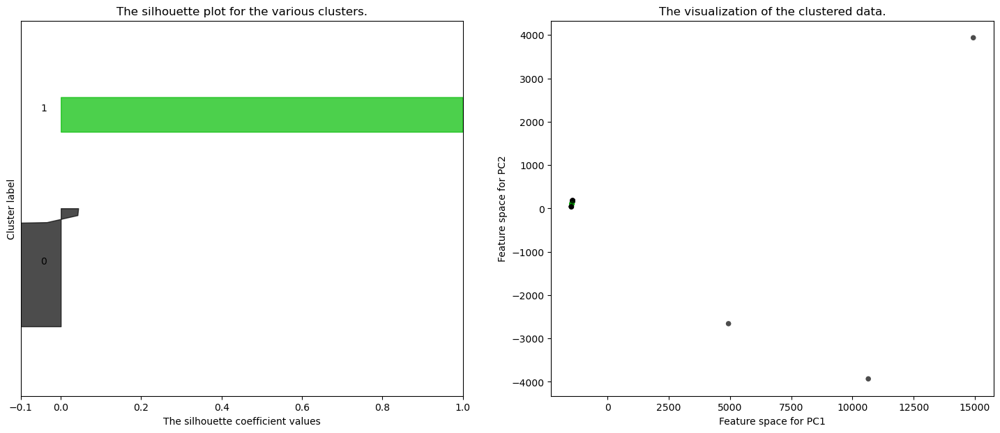

For epsilon = 84.55172413793103 The average silhouette_score is : -0.12870977559573984


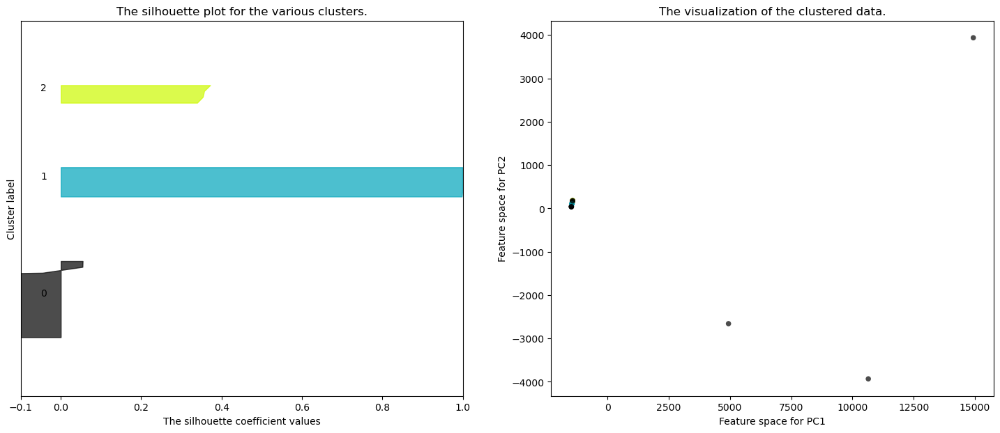

For epsilon = 86.6896551724138 The average silhouette_score is : -0.08102419927995913


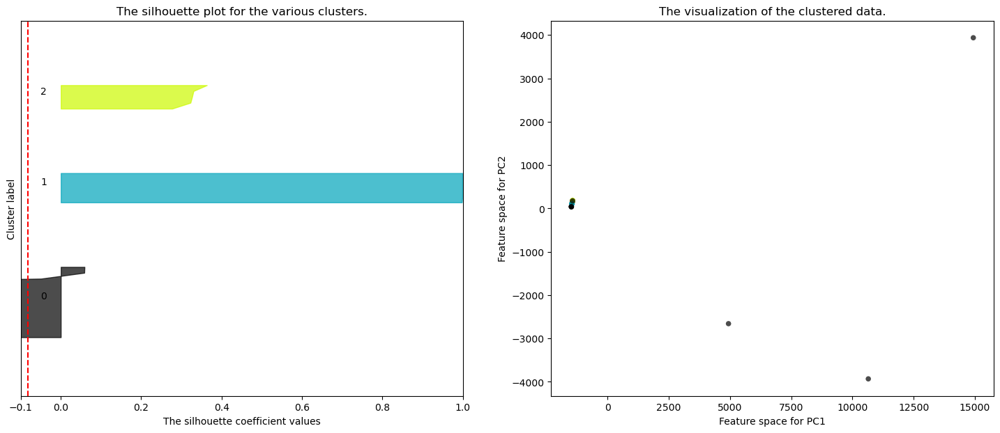

For epsilon = 88.82758620689656 The average silhouette_score is : -0.08102419927995913


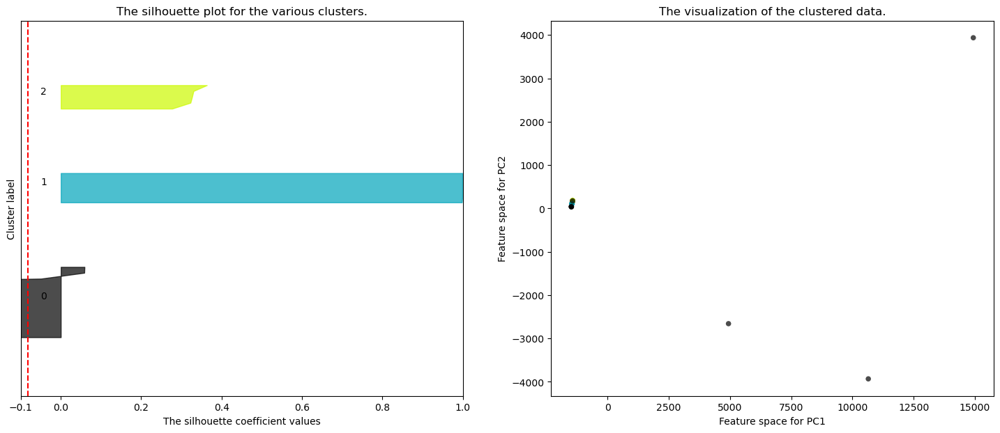

For epsilon = 90.9655172413793 The average silhouette_score is : 0.1265654777037611


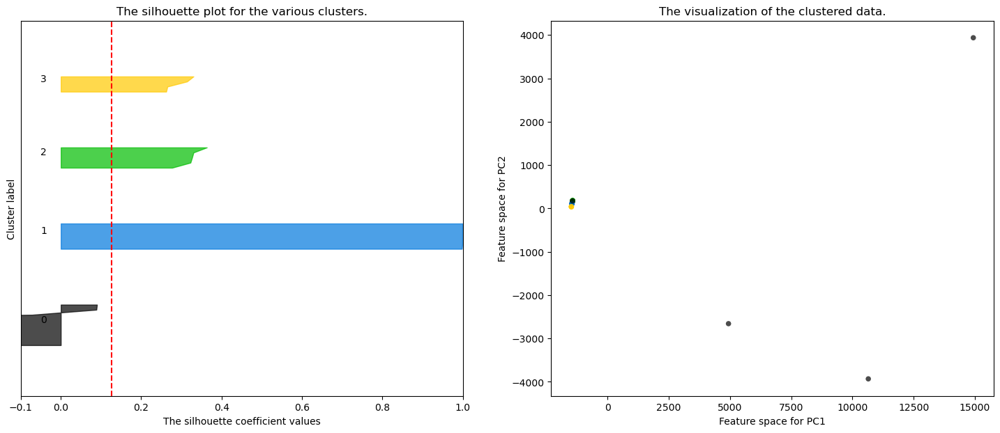

For epsilon = 93.10344827586206 The average silhouette_score is : 0.17205309505293206


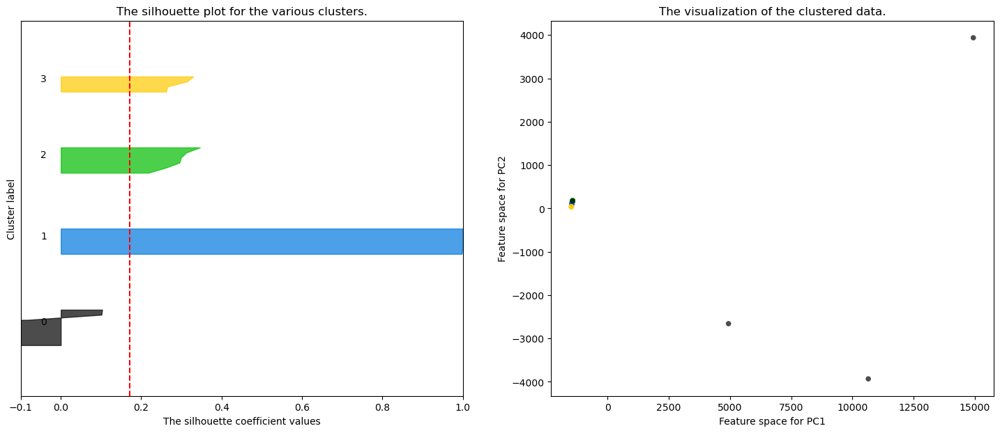

For epsilon = 95.24137931034483 The average silhouette_score is : 0.17205309505293206


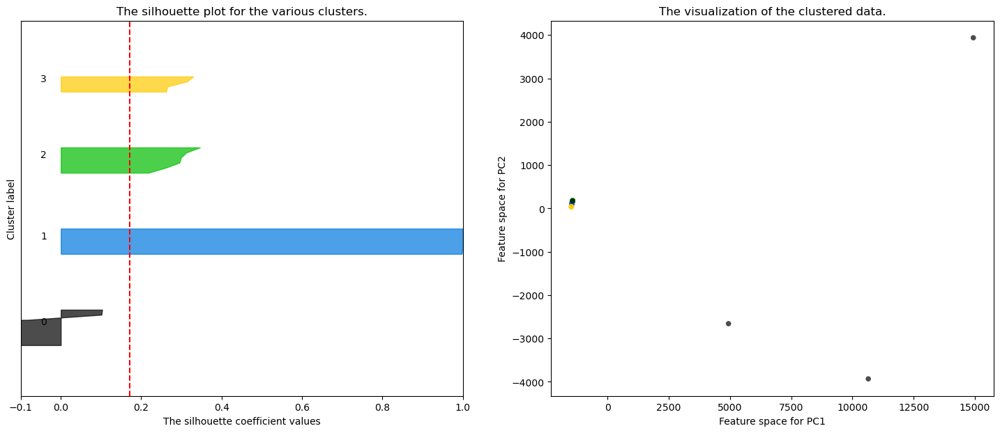

For epsilon = 97.37931034482759 The average silhouette_score is : 0.21639889146531224


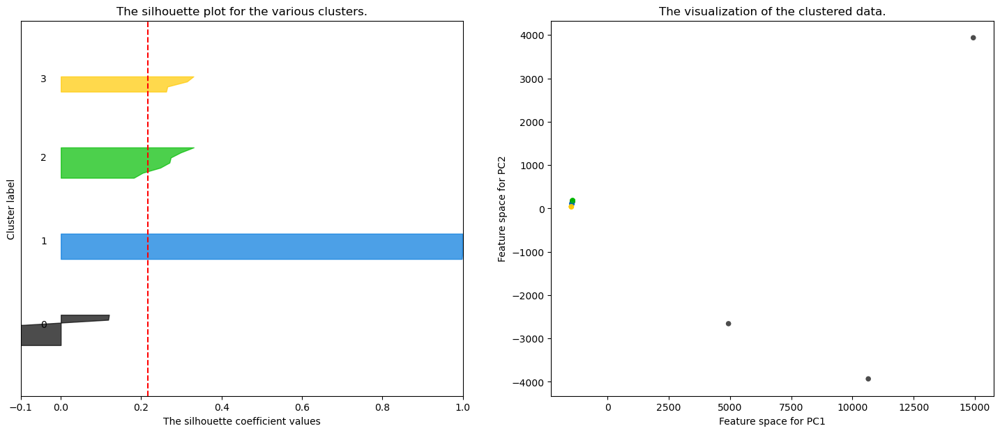

For epsilon = 99.51724137931035 The average silhouette_score is : 0.21639889146531224


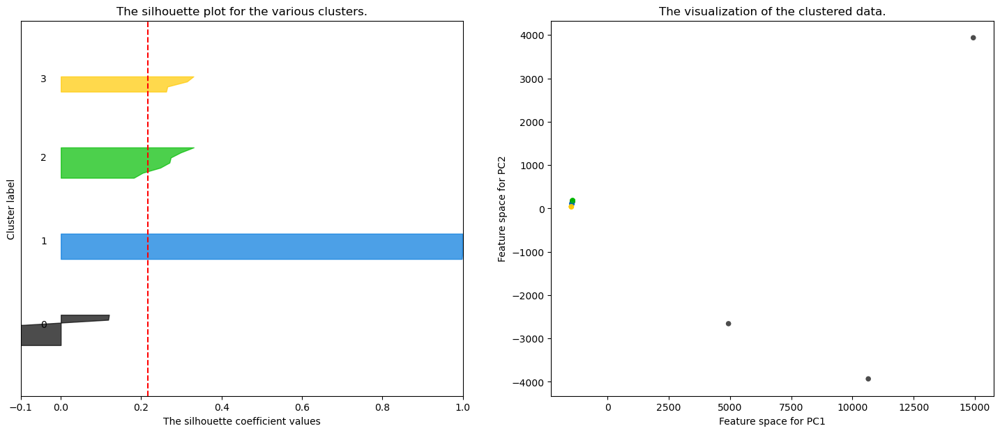

For epsilon = 101.65517241379311 The average silhouette_score is : 0.25933411681421453


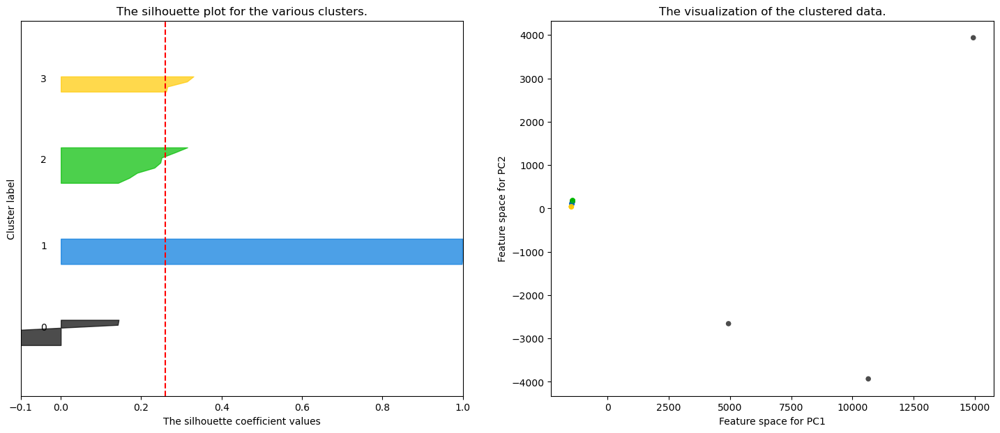

For epsilon = 103.79310344827586 The average silhouette_score is : 0.25933411681421453


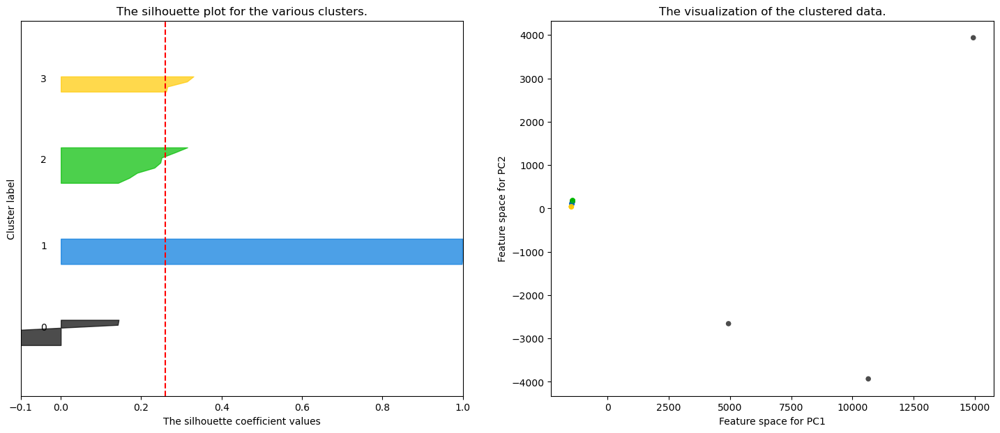

For epsilon = 105.93103448275862 The average silhouette_score is : 0.25933411681421453


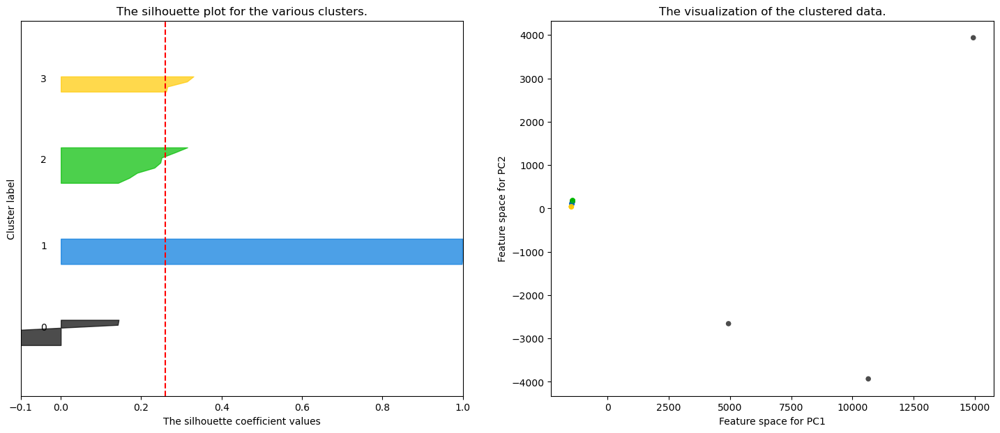

For epsilon = 108.06896551724137 The average silhouette_score is : 0.25933411681421453


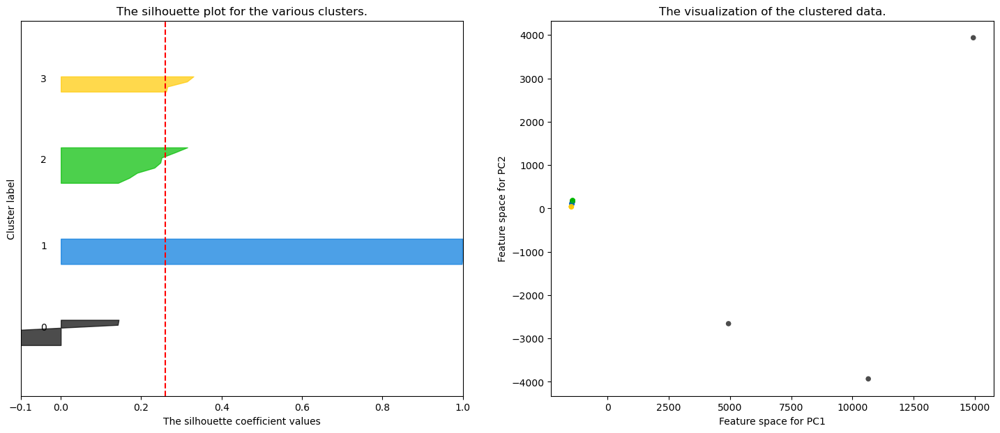

For epsilon = 110.20689655172413 The average silhouette_score is : 0.25933411681421453


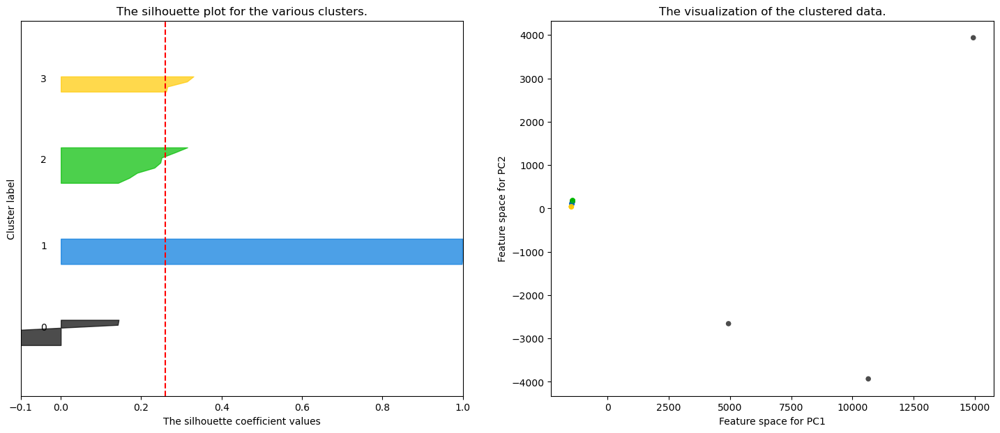

For epsilon = 112.34482758620689 The average silhouette_score is : 0.25933411681421453


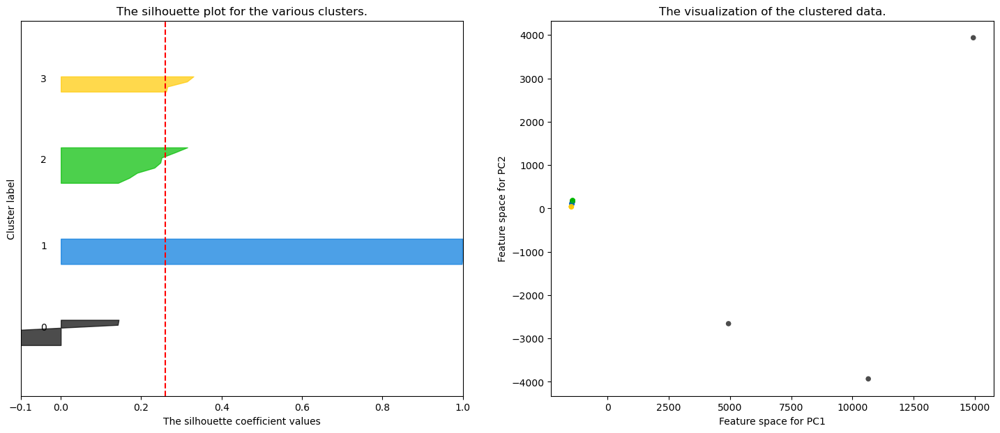

For epsilon = 114.48275862068965 The average silhouette_score is : 0.25933411681421453


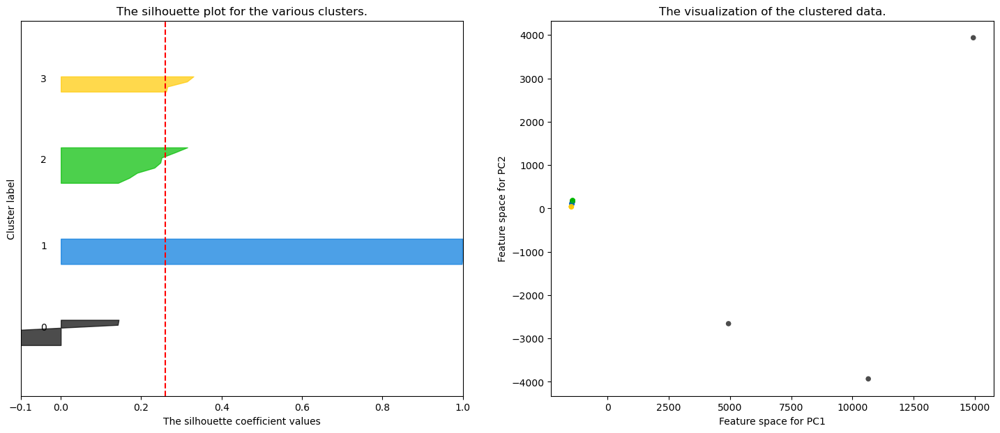

For epsilon = 116.62068965517241 The average silhouette_score is : 0.25933411681421453


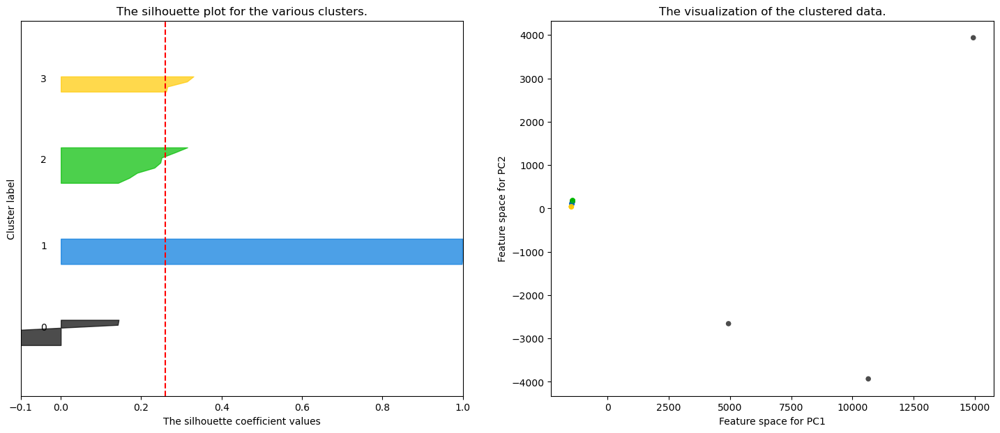

For epsilon = 118.75862068965517 The average silhouette_score is : 0.25933411681421453


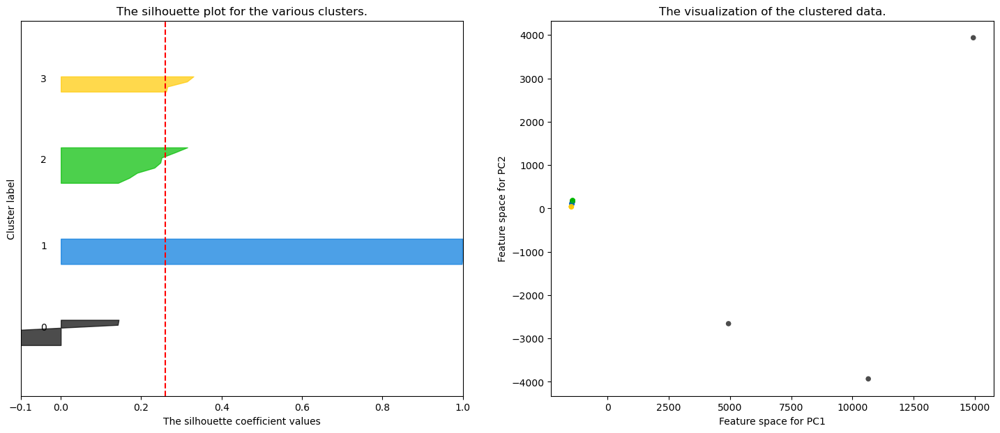

For epsilon = 120.89655172413794 The average silhouette_score is : 0.25933411681421453


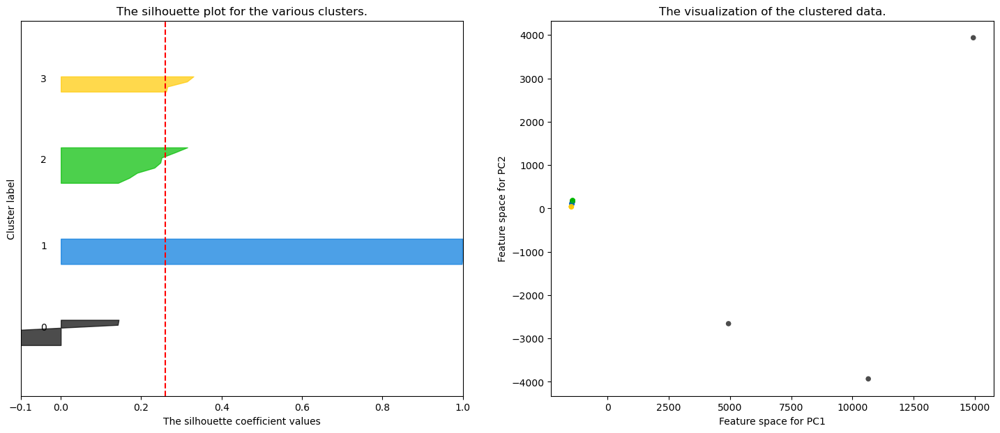

For epsilon = 123.03448275862068 The average silhouette_score is : 0.25933411681421453


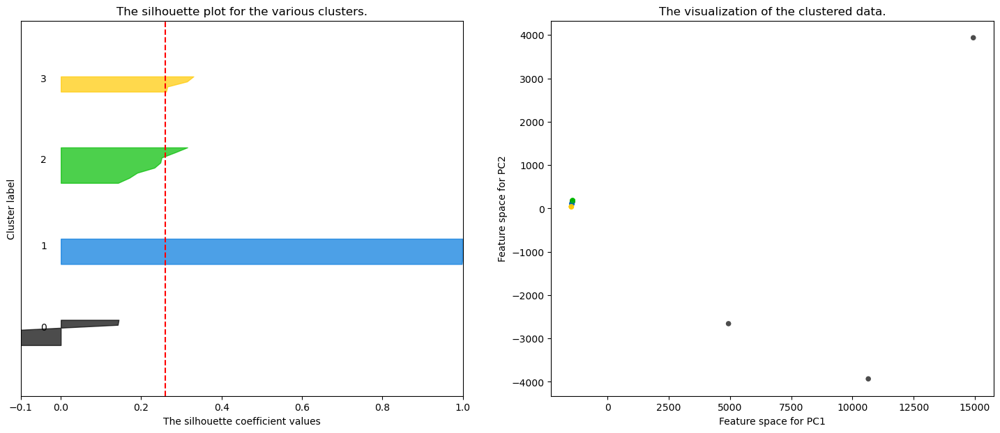

For epsilon = 125.17241379310344 The average silhouette_score is : 0.25933411681421453


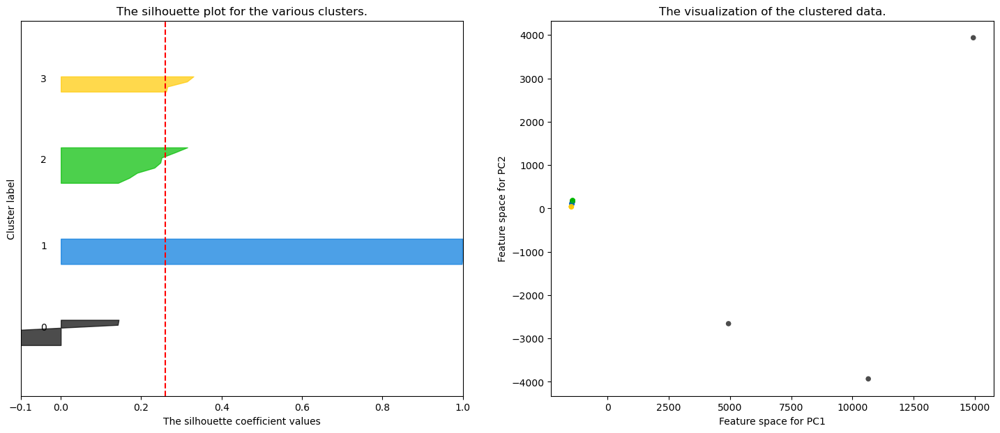

For epsilon = 127.3103448275862 The average silhouette_score is : 0.25933411681421453


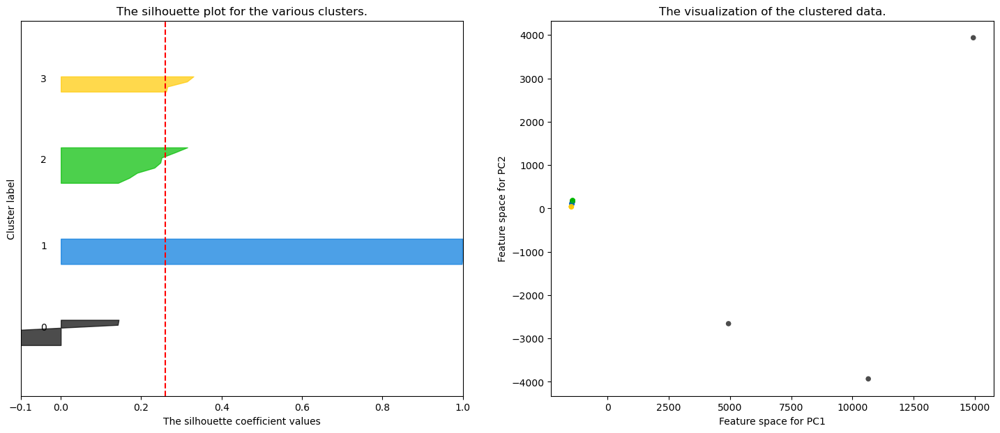

For epsilon = 129.44827586206895 The average silhouette_score is : 0.8852620803244733


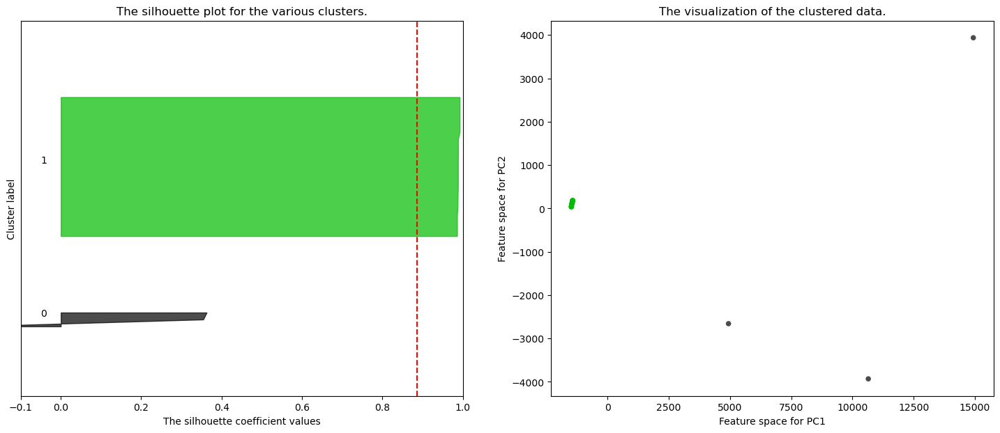

For epsilon = 131.58620689655172 The average silhouette_score is : 0.8852620803244733


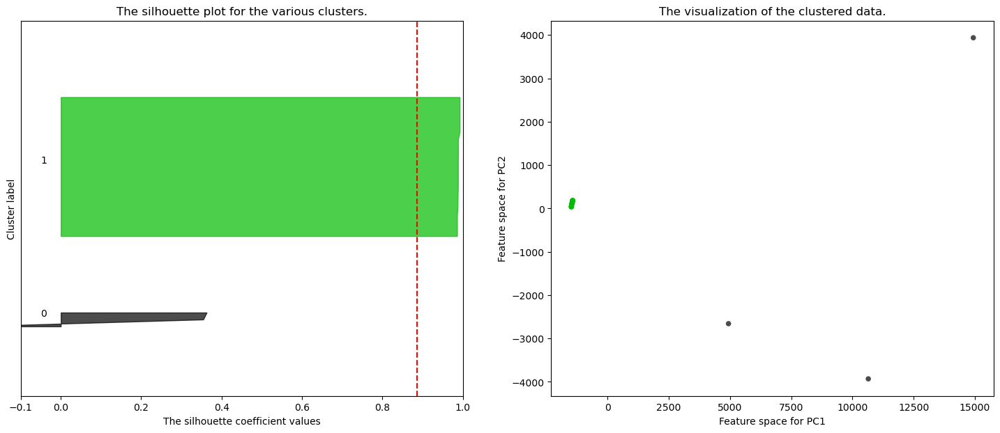

For epsilon = 133.72413793103448 The average silhouette_score is : 0.8852620803244733


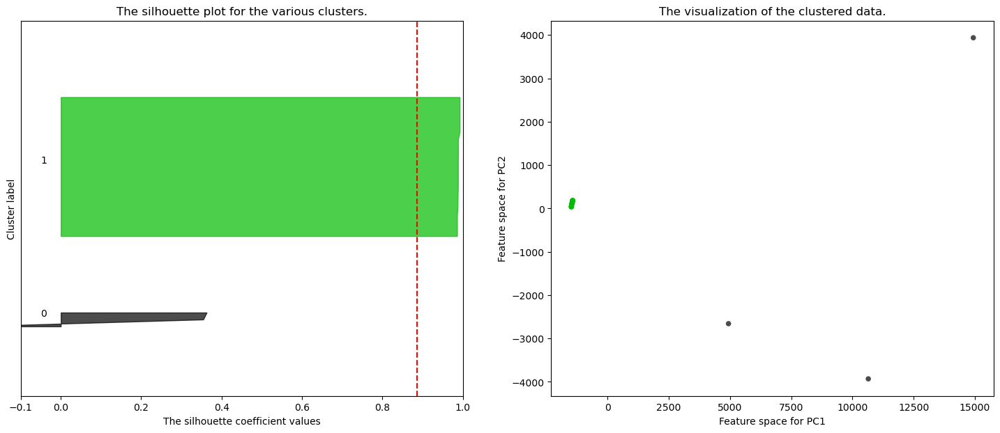

For epsilon = 135.86206896551724 The average silhouette_score is : 0.8852620803244733


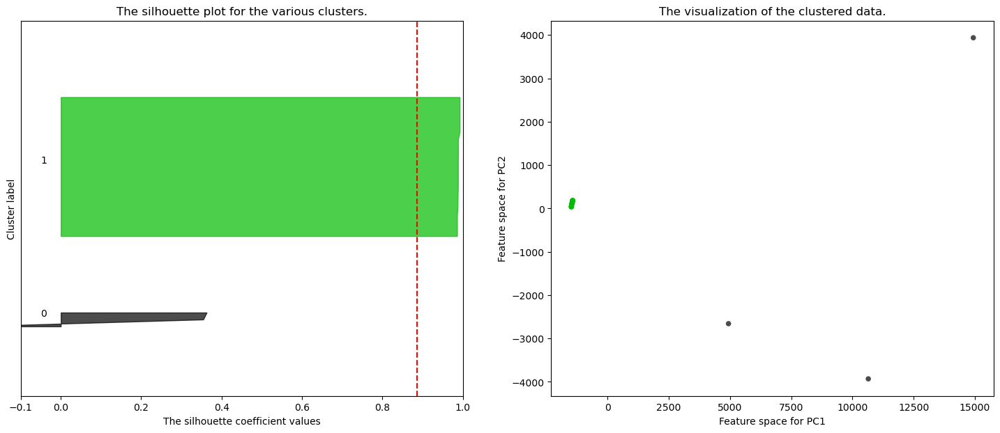

For epsilon = 138.0 The average silhouette_score is : 0.8852620803244733


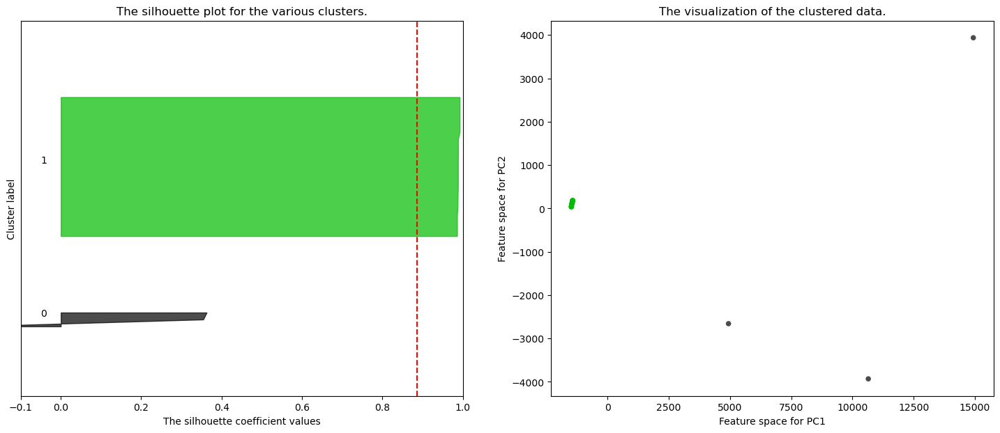

In [26]:
for eps in np.linspace(76,138,30):
    clusterer = DBSCAN(eps = eps, min_samples = 3)

    cluster_labels = clusterer.fit_predict(X_standard)
    
    cluster_labels = cluster_labels + 1
    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters

    if (len(np.unique(cluster_labels))>1):
        
        silhouette_avg = silhouette_score(X_standard, cluster_labels)
        print("For epsilon =",
            eps,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X_standard, cluster_labels)
        
        
        n_clusters = len(np.unique(cluster_labels))

        y_lower = 10
        
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X_standard) + (n_clusters + 1) * 10])
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)

        # Reduce to 2 dimensions using PCA
        pca = PCA(n_components=2)
        X_2d = pca.fit_transform(X_standard)

        ax2.scatter(
            X_2d[:, 0], X_2d[:, 1], marker="o", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
        )
        
        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for PC1")
        ax2.set_ylabel("Feature space for PC2")


    plt.show()